### Uygulamada fine-tuning çeşitleri ikiye ayrılır;

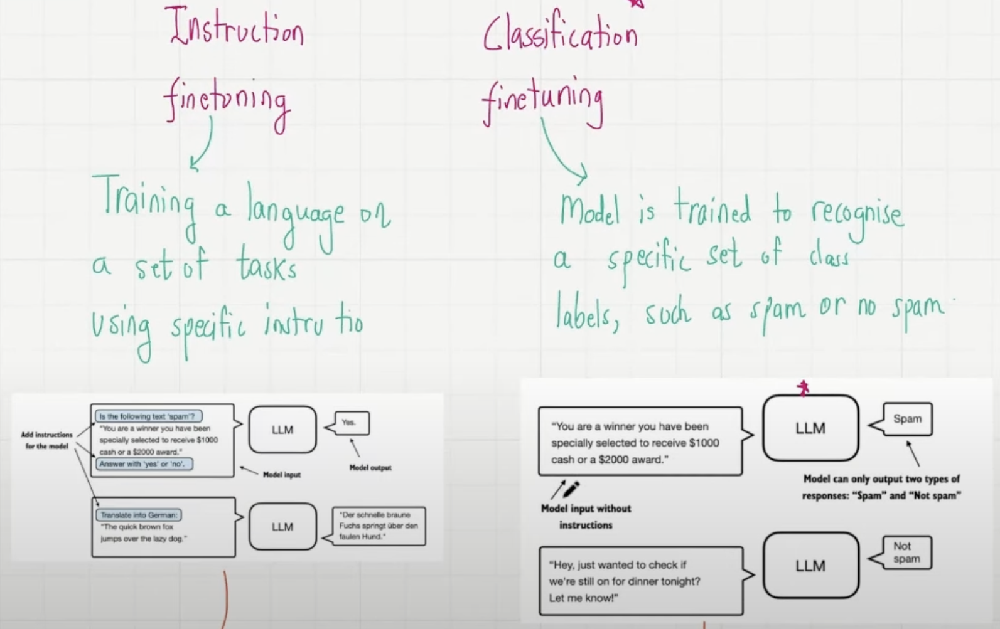

# SINIFLANDIRMA (CLASSIFICATION) İÇİN FINETUNING

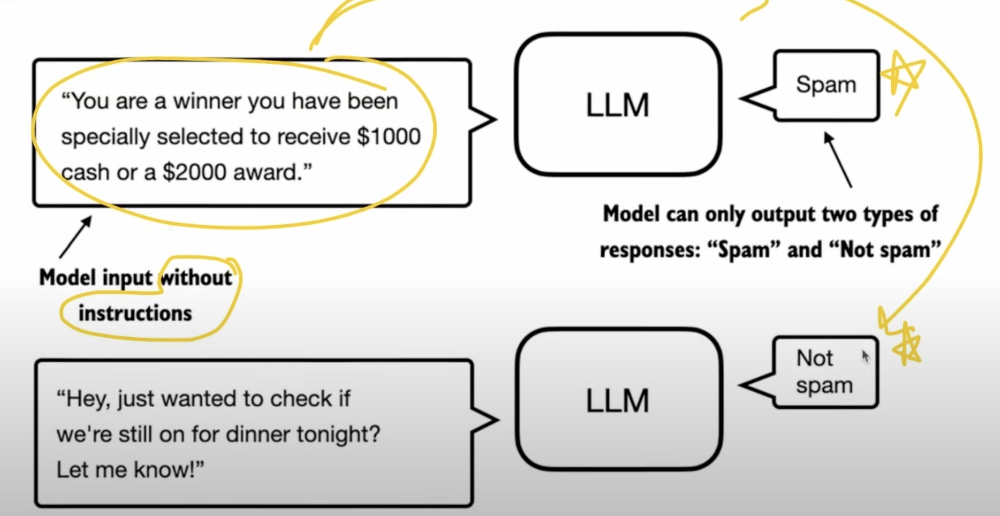

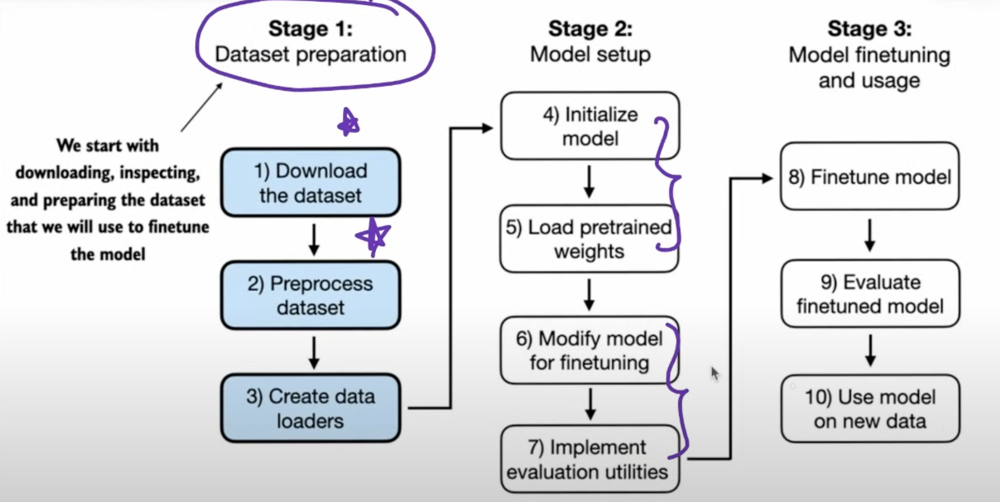

### DATASETİ İNDİRME

In [2]:
import urllib.request
import ssl
import zipfile
import os
from pathlib import Path

url = "https://archive.ics.uci.edu/static/public/228/sms+spam+collection.zip"
zip_path = "sms_spam_collection.zip"
extracted_path = "data/sms_spam_collection"
data_file_path = Path(extracted_path) / "SMSSpamCollection.tsv"

def download_and_unzip_spam_data(url, zip_path, extracted_path, data_file_path):
    if data_file_path.exists():
        print(f"{data_file_path} already exists. Skipping download and extraction.")
        return

    # Doğrulanmamış bir SSL bağlamı oluşturun
    ssl_context = ssl._create_unverified_context()

    # Dosyayı indir
    with urllib.request.urlopen(url, context=ssl_context) as response:
        with open(zip_path, "wb") as out_file:
            out_file.write(response.read())

    # Dosyayı unzip et
    with zipfile.ZipFile(zip_path, "r") as zip_ref:
        zip_ref.extractall(extracted_path)

    # ".tsv" dosya uzantısı ver
    original_file_path = Path(extracted_path) / "SMSSpamCollection"
    os.rename(original_file_path, data_file_path)
    print(f"File downloaded and saved as {data_file_path}")

download_and_unzip_spam_data(url, zip_path, extracted_path, data_file_path)


data/sms_spam_collection/SMSSpamCollection.tsv already exists. Skipping download and extraction.


<div class="alert alert-block alert-info">

Önceki kodu çalıştırdıktan sonra, veri kümesi sekmeyle ayrılmış bir metin dosyası olarak kaydedilir,
SMSSpamCollection.tsv, sms_spam_collection klasöründe.

Bunu bir pandas
DataFrame'e aşağıdaki gibi yükleyebiliriz:

</div>

In [3]:
! pip install pandas

In [4]:
import pandas as pd

df = pd.read_csv(data_file_path, sep="\t", header=None, names=["Label", "Text"])
df

,Label,Text
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."
...,...,...
5567,spam,This is the 2nd time we have tried 2 contact u...
5568,ham,Will ü b going to esplanade fr home?
5569,ham,"Pity, * was in mood for that. So...any other s..."
5570,ham,The guy did some bitching but I acted like i'd...


<div class="alert alert-block alert-success">

Sınıf dağılımını kontrol ettiğimizde, verilerin "spam"den çok daha sık "ham" (yani "spam değil") içerdiğini görüyoruz.
    
</div>

In [5]:
print(df["Label"].value_counts())


Label
ham     4825
spam     747
Name: count, dtype: int64


<div class="alert alert-block alert-info">

Basitleştirmek için ve zaten eğitim amaçlı küçük bir veri kümesini tercih ettiğimizden (bu, LLM'yi daha hızlı ince ayar yapmayı mümkün kılacaktır), veri kümesini her sınıftan 747 örnek içerecek şekilde alt örnekleme (under-örnekleme) yapıyoruz.

</div>

In [6]:
def create_balanced_dataset(df):
    
    # "Spam" örneklerini say
    num_spam = df[df["Label"] == "spam"].shape[0]
    
    # "Spam" örneklerinin sayısıyla eşleşmesi için rastgele "ham" örnekleri örnekle
    ham_subset = df[df["Label"] == "ham"].sample(num_spam, random_state=123)
    
    # "ham" alt kümesini "spam" ile birleştir
    balanced_df = pd.concat([ham_subset, df[df["Label"] == "spam"]])

    return balanced_df

balanced_df = create_balanced_dataset(df)
print(balanced_df["Label"].value_counts())

Label
ham     747
spam    747
Name: count, dtype: int64


<div class="alert alert-block alert-info">

Veri setini dengelemek için önceki kodu çalıştırdıktan sonra, artık eşit miktarda spam ve spam olmayan mesajımız olduğunu görebiliriz:

</div>

<div class="alert alert-block alert-success">

Daha sonra, "string" sınıf etiketleri "ham" ve "spam"ı sırasıyla 0 ve 1 tamsayı sınıf etiketlerine dönüştürüyoruz:
    
</div>

In [7]:
balanced_df["Label"] = balanced_df["Label"].map({"ham": 0, "spam": 1})

<div class="alert alert-block alert-info">

Bu süreç, metni token kimliklerine dönüştürmeye benzer.

Ancak, 50.000'den fazla kelimeden oluşan GPT
sözcük dağarcığını kullanmak yerine, yalnızca iki token
kimliğiyle uğraşıyoruz: 0 ve 1.

</div>

<div class="alert alert-block alert-success">

Veri setini üç parçaya bölmek için random_split işlevi oluşturuyoruz: %70 eğitim için, %10 doğrulama için ve %20 test için.

(Bu oranlar makine öğreniminde modelleri eğitmek, ayarlamak ve değerlendirmek için yaygındır.)
 
</div>

In [8]:
def random_split(df, train_frac, validation_frac):
    # Tüm DataFrame'i karıştır
    df = df.sample(frac=1, random_state=123).reset_index(drop=True)

    # Bölünmüş endeksleri hesapla
    train_end = int(len(df) * train_frac)
    validation_end = train_end + int(len(df) * validation_frac)

    # DataFrame'i böl
    train_df = df[:train_end]
    validation_df = df[train_end:validation_end]
    test_df = df[validation_end:]

    return train_df, validation_df, test_df

train_df, validation_df, test_df = random_split(balanced_df, 0.7, 0.1)
# Test boyutunun kalan olarak 0,2 olduğu varsayılmaktadır


In [9]:
print(len(train_df))
print(len(validation_df))
print(len(test_df))

1045
149
300


<div class="alert alert-block alert-success">

Ayrıca, veri setini daha sonra tekrar kullanabileceğimiz CSV (virgülle ayrılmış değer) dosyaları olarak kaydediyoruz:
</div>

In [10]:
train_df.to_csv("data/train.csv", index=None)
validation_df.to_csv("data/validation.csv", index=None)
test_df.to_csv("data/test.csv", index=None)

### DATALOADER OLUŞTURULMASI

<div class="alert alert-block alert-success">

Daha önce, daha verimli model eğitimi için gruplara ayrılan tek tip boyutlu metin parçaları oluşturmak için kayan pencere (sliding window) tekniğini kullandık. Her parça, ayrı bir eğitim örneği olarak işlev gördü.

E-posta spam sınıflandırması durumunda, iki temel seçeneğiniz olsun:

(1) Tüm mesajları veri kümesindeki veya gruptaki en kısa mesajın uzunluğuna göre kesin.

(2) Tüm mesajları veri kümesindeki veya gruptaki en uzun mesajın uzunluğuna göre doldurun (end of text token).
    
</div>

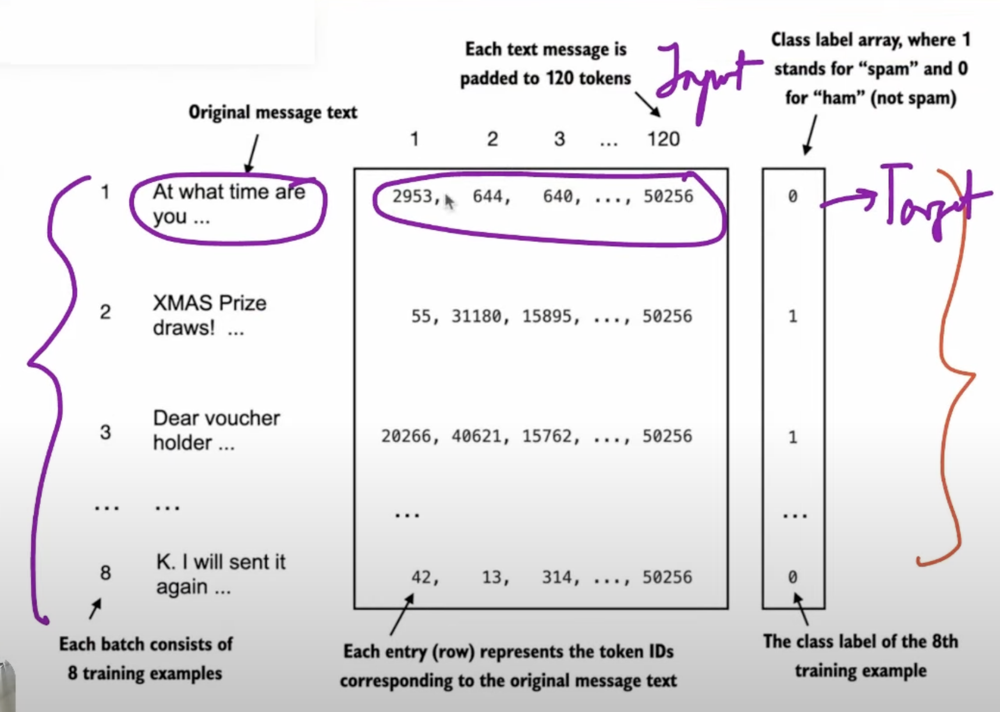

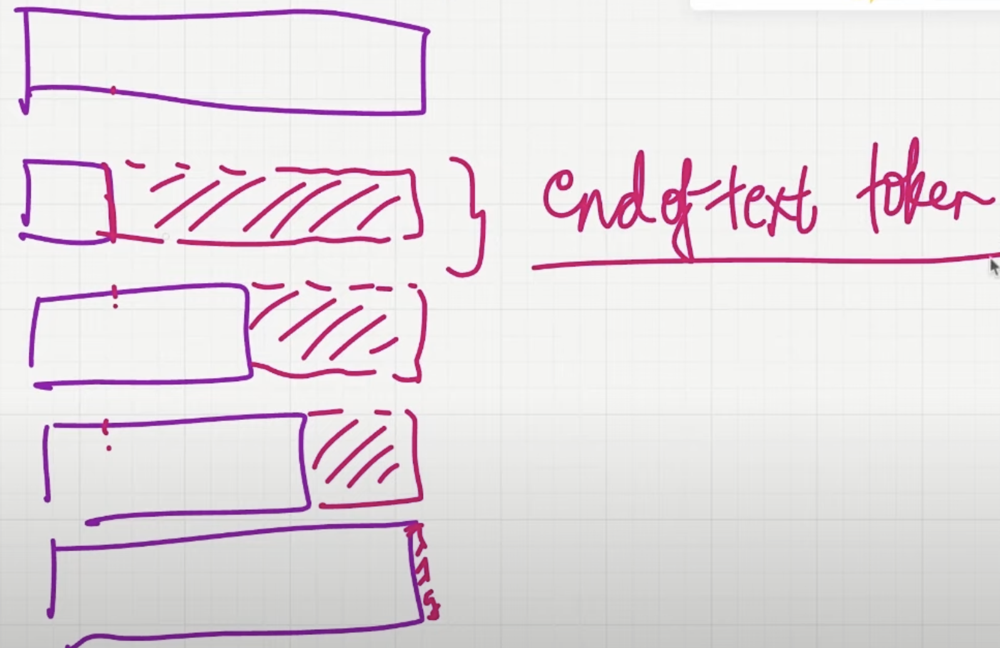

<div class="alert alert-block alert-warning">

Seçenek 1 hesaplama açısından daha ucuzdur, ancak daha kısa mesajlar ortalama veya en uzun mesajlardan çok daha küçükse önemli bilgi kaybına neden olabilir ve bu da potansiyel olarak model performansını düşürebilir.

Bu nedenle, tüm mesajların tüm içeriğini koruyan ikinci seçeneği tercih ediyoruz.

Tüm mesajların veri kümesindeki en uzun mesajın uzunluğuna kadar doldurulduğu 2. seçeneği uygulamak için, tüm daha kısa mesajlara padding belirteçleri ekliyoruz.

Bu amaçla, 2. bölümde tartışıldığı gibi, padding tokenı olarak "<|endoftext|>" kullanıyoruz.

Ancak, her bir metin mesajına doğrudan "<|endoftext|>" dizesini eklemek yerine, kodlanmış metne "<|endoftext|>" ile ilgili token kimliğini ekleyebiliriz.
</div>

<div class="alert alert-block alert-success">

Daha önce gördüğümüz gibi, dataloader'ı örnekleyebilmemiz için öncelikle verilerin nasıl yüklenip işleneceğini belirten bir PyTorch Veri Kümesi uygulamamız gerekiyor.
    
</div>

<div class="alert alert-block alert-success">

Bu amaçla SpamDataset sınıfını tanımlıyoruz.

Bu SpamDataset sınıfı birkaç temel görevi ele alır: eğitim veri kümesindeki en uzun diziyi belirler, metin mesajlarını kodlar ve diğer tüm dizilerin en uzun dizinin uzunluğuyla eşleşecek şekilde bir padding tokenı ile doldurulmasını sağlar.
    
</div>

In [11]:
import pandas as pd
import torch
from torch.utils.data import Dataset


class SpamDataset(Dataset):
    def __init__(self, csv_file, tokenizer, max_length=None, pad_token_id=50256):
        self.data = pd.read_csv(csv_file)

        # Pre-tokenize texts
        self.encoded_texts = [
            tokenizer.encode(text) for text in self.data["Text"]
        ]

        if max_length is None:
            self.max_length = self._longest_encoded_length()
        else:
            self.max_length = max_length
            
            # Diziler max_length değerinden uzunsa dizileri kesin
            self.encoded_texts = [
                encoded_text[:self.max_length]
                for encoded_text in self.encoded_texts
            ]

        # Dizileri en uzun diziye kadar pedleyin
        self.encoded_texts = [
            encoded_text + [pad_token_id] * (self.max_length - len(encoded_text))
            for encoded_text in self.encoded_texts
        ]

    def __getitem__(self, index):
        encoded = self.encoded_texts[index]
        label = self.data.iloc[index]["Label"]
        return (
            torch.tensor(encoded, dtype=torch.long),
            torch.tensor(label, dtype=torch.long)
        )

    def __len__(self):
        return len(self.data)

    def _longest_encoded_length(self):
        max_length = 0
        for encoded_text in self.encoded_texts:
            encoded_length = len(encoded_text)
            if encoded_length > max_length:
                max_length = encoded_length
        return max_length

<div class="alert alert-block alert-info">

Adım 1: Pre-tokenizing text

Adım 2: Diziler max_length'ten uzunsa kesin

Adım 3: Dizileri en uzun diziye doldurun

</div>

<div class="alert alert-block alert-warning">

SpamDataset sınıfı, daha önce oluşturduğumuz CSV dosyalarından veri yükler, tiktoken'dan GPT-2 tokenizerını kullanarak metni tokenize edilir ve dizileri en uzun dizi veya önceden tanımlanmış maksimum uzunlukla belirlenen tek düze bir uzunluğa padding uygulamamıza veya kesmemize olanak tanır.
</div>

<div class="alert alert-block alert-success">

Bu, her giriş tensörünün aynı boyutta olmasını sağlar; bu, bir sonraki uygulayacağımız eğitim veri yükleyicisindeki grupları oluşturmak için gereklidir:
    
</div>

In [12]:
import tiktoken

tokenizer = tiktoken.get_encoding("gpt2")

train_dataset = SpamDataset(
    csv_file="data/train.csv",
    max_length=None,
    tokenizer=tokenizer
)

print(train_dataset.max_length)

120


<div class="alert alert-block alert-info">

Kod 120 çıktısı verir ve bu, en uzun dizinin 120'den fazla token içermediğini gösterir; bu, metin mesajları için yaygın bir uzunluktur.

Modelin, bağlam uzunluğu sınırı göz önüne alındığında 1.024 token'a kadar olan dizileri işleyebileceğini belirtmekte fayda var.

Veri kümeniz daha uzun metinler içeriyorsa, önceki kodda eğitim veri kümesini oluştururken max_length=1024 değerini geçirerek verilerin modelin desteklediği giriş (bağlam) uzunluğunu aşmamasını sağlayabilirsiniz.

</div>

<div class="alert alert-block alert-success">

Daha sonra, doğrulama ve test kümelerini en uzun eğitim dizisinin uzunluğuna uyacak şekilde dolduruyoruz.

En uzun eğitim örneğinin uzunluğunu aşan herhangi bir doğrulama ve test kümesi örneğinin daha önce tanımladığımız SpamDataset kodunda encoded_text[:self.max_length] kullanılarak kesildiğini belirtmek önemlidir.

Bu kesme isteğe bağlıdır; bu kümelerde 1.024 belirteci aşan hiçbir dizi olmadığı sürece, hem doğrulama hem de test kümeleri için max_length=None da ayarlayabilirsiniz.

</div>

In [13]:
val_dataset = SpamDataset(
    csv_file="data/validation.csv",
    max_length=train_dataset.max_length,
    tokenizer=tokenizer
)
test_dataset = SpamDataset(
    csv_file="data/test.csv",
    max_length=train_dataset.max_length,
    tokenizer=tokenizer
)

print(test_dataset.max_length)

120


<div class="alert alert-block alert-success">

Veri kümelerini girdi olarak kullanarak, dataloaderı daha önce yaptığımıza benzer şekilde örneklendirebiliriz.

Ancak, bu durumda hedefler metindeki sonraki tokenlar yerine sınıf etiketlerini temsil eder.

Örneğin, 8'lik bir batch boyutu seçildiğinde, her batch 120 uzunluğunda 8 eğitim örneğinden ve her örneğin karşılık gelen sınıf etiketinden oluşacaktır.

</div>

In [14]:
from torch.utils.data import DataLoader

num_workers = 0
batch_size = 8

torch.manual_seed(123)

train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers,
    drop_last=True,
)

val_loader = DataLoader(
    dataset=val_dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    drop_last=False,
)

test_loader = DataLoader(
    dataset=test_dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    drop_last=False,
)

<div class="alert alert-block alert-success">

Dataloader'ın çalıştığından ve gerçekten beklenen boyutta gruplar döndürdüğünden emin olmak için, eğitim yükleyicisi üzerinde yineleme yaparız ve ardından son grubun tensör boyutlarını yazdırırız:

</div>

In [15]:
print("Train loader:")
for input_batch, target_batch in train_loader:
    pass

print("Input batch dimensions:", input_batch.shape)
print("Label batch dimensions", target_batch.shape)

Train loader:
Input batch dimensions: torch.Size([8, 120])
Label batch dimensions torch.Size([8])


<div class="alert alert-block alert-info">

Gördüğümüz gibi, girdi grupları, beklendiği gibi, her biri 120 tokendan oluşan 8 eğitim örneğinden oluşuyor.

Etiket tensörü, 8 eğitim örneğine karşılık gelen sınıf etiketlerini depolar.

</div>

<div class="alert alert-block alert-success">

Son olarak, veri kümesinin boyutu hakkında bir fikir edinmek için her veri kümesindeki batch sayısını yazdıralım:

</div>

In [16]:
print(f"{len(train_loader)} training batches")
print(f"{len(val_loader)} validation batches")
print(f"{len(test_loader)} test batches")

130 training batches
19 validation batches
38 test batches


<div class="alert alert-block alert-success">

Veri hazırlama işlemi burada sona eriyor. Ardından, modeli
ince ayar için hazırlayacağız.

</div>

## ÖNCEDEN EĞİTİLMİŞ AĞIRLIKLARLA BİR MODEL BAŞLATMA

<div class="alert alert-block alert-success">

Bu bölümde, spam mesajlarını tanımlamak için classification-finetuning için kullanacağımız modeli hazırlıyoruz.

Önceki bölümde çalıştığımız önceden eğitilmiş (pre-trained) modeli başlatarak başlıyoruz
</div>

In [17]:
CHOOSE_MODEL = "gpt2-small (124M)"
INPUT_PROMPT = "Every effort moves"

BASE_CONFIG = {
    "vocab_size": 50257,     # Vocabulary size
    "context_length": 1024,  # Context length
    "drop_rate": 0.0,        # Dropout rate
    "qkv_bias": True         # Query-key-value bias
}

model_configs = {
    "gpt2-small (124M)": {"emb_dim": 768, "n_layers": 12, "n_heads": 12},
    "gpt2-medium (355M)": {"emb_dim": 1024, "n_layers": 24, "n_heads": 16},
    "gpt2-large (774M)": {"emb_dim": 1280, "n_layers": 36, "n_heads": 20},
    "gpt2-xl (1558M)": {"emb_dim": 1600, "n_layers": 48, "n_heads": 25},
}

BASE_CONFIG.update(model_configs[CHOOSE_MODEL])

assert train_dataset.max_length <= BASE_CONFIG["context_length"], (
    f"Dataset length {train_dataset.max_length} exceeds model's context "
    f"length {BASE_CONFIG['context_length']}. Reinitialize data sets with "
    f"`max_length={BASE_CONFIG['context_length']}`"
)

<div class="alert alert-block alert-success">

Daha sonra, gpt_download3.py dosyasından download_and_load_gpt fonksiyonunu içe aktarıyoruz.

Ayrıca, indirilen ağırlıkları GPT modeline yüklemek için GPTModel sınıfını ve
load_weights_into_gpt fonksiyonunu yeniden kullanıyoruz:

</div>

In [19]:
import torch.nn as nn

class LayerNorm(nn.Module):
    def __init__(self, emb_dim):
        super().__init__()
        self.eps = 1e-5
        self.scale = nn.Parameter(torch.ones(emb_dim))
        self.shift = nn.Parameter(torch.zeros(emb_dim))

    def forward(self, x):
        mean = x.mean(dim=-1, keepdim=True)
        var = x.var(dim=-1, keepdim=True, unbiased=False)
        norm_x = (x - mean) / torch.sqrt(var + self.eps)
        return self.scale * norm_x + self.shift

class GELU(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return 0.5 * x * (1 + torch.tanh(
            torch.sqrt(torch.tensor(2.0 / torch.pi)) * 
            (x + 0.044715 * torch.pow(x, 3))
        ))

class FeedForward(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Linear(cfg["emb_dim"], 4 * cfg["emb_dim"]), ## Expansion
            GELU(), ## Activation
            nn.Linear(4 * cfg["emb_dim"], cfg["emb_dim"]), ## Contraction
        )

    def forward(self, x):
        return self.layers(x)

In [ ]:
class MultiHeadAttention(nn.Module):
    def __init__(self, d_in, d_out, context_length, dropout, num_heads, qkv_bias=False):
        super().__init__()
        assert (d_out % num_heads == 0), \
            "d_out must be divisible by num_heads"

        self.d_out = d_out
        self.num_heads = num_heads
        self.head_dim = d_out // num_heads # İstenilen çıkış karartmasıyla eşleşecek şekilde projeksiyon karartmasını azaltın

        self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.out_proj = nn.Linear(d_out, d_out)  # Head çıkışlarını birleştirmek için doğrusal katman
        self.dropout = nn.Dropout(dropout)
        self.register_buffer(
            "mask",
            torch.triu(torch.ones(context_length, context_length),
                       diagonal=1)
        )

    def forward(self, x):
        b, num_tokens, d_in = x.shape

        keys = self.W_key(x) # Shape: (b, num_tokens, d_out)
        queries = self.W_query(x)
        values = self.W_value(x)

        # Matrisi örtük olarak `num_heads` boyutunu ekleyerek böldük
        # Son dim'i aç: (b, num_tokens, d_out) -> (b, num_tokens, num_heads, head_dim)
        keys = keys.view(b, num_tokens, self.num_heads, self.head_dim) 
        values = values.view(b, num_tokens, self.num_heads, self.head_dim)
        queries = queries.view(b, num_tokens, self.num_heads, self.head_dim)

        # Transpose: (b, num_tokens, num_heads, head_dim) -> (b, num_heads, num_tokens, head_dim)
        keys = keys.transpose(1, 2)
        queries = queries.transpose(1, 2)
        values = values.transpose(1, 2)

        # Nedensel bir maske ile ölçeklenmiş dot-product attention (diğer adıyla sef-attention) hesaplayın
        attn_scores = queries @ keys.transpose(2, 3)  # Her bir head için dot-product

        # Orijinal maske, belirteç sayısına bölündü ve Boolean'a dönüştürüldü
        mask_bool = self.mask.bool()[:num_tokens, :num_tokens]

        # Attention puanlarını doldurmak için maskeyi kullanın
        attn_scores.masked_fill_(mask_bool, -torch.inf)
        
        attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
        attn_weights = self.dropout(attn_weights)

        # Shape: (b, num_tokens, num_heads, head_dim)
        context_vec = (attn_weights @ values).transpose(1, 2) 
        
        # self.d_out = self.num_heads * self.head_dim iken headleri kobine edin
        context_vec = context_vec.contiguous().view(b, num_tokens, self.d_out)
        context_vec = self.out_proj(context_vec) # opsiyonel projeksiyon

        return context_vec

In [21]:

class TransformerBlock(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.att = MultiHeadAttention(
            d_in=cfg["emb_dim"],
            d_out=cfg["emb_dim"],
            context_length=cfg["context_length"],
            num_heads=cfg["n_heads"], 
            dropout=cfg["drop_rate"],
            qkv_bias=cfg["qkv_bias"])
        self.ff = FeedForward(cfg)
        self.norm1 = LayerNorm(cfg["emb_dim"])
        self.norm2 = LayerNorm(cfg["emb_dim"])
        self.drop_shortcut = nn.Dropout(cfg["drop_rate"])

    def forward(self, x):
        # Attention bloğu için shortcut bağlantıları
        shortcut = x
        x = self.norm1(x)
        x = self.att(x)  # Shape [batch_size, num_tokens, emb_size]
        x = self.drop_shortcut(x)
        x = x + shortcut  # Orijinal girdiyi yeniden ekle 
        
        # Feedforward blok için shortcut bağlantıları
        shortcut = x
        x = self.norm2(x)
        x = self.ff(x)
        # 2*4*768
        x = self.drop_shortcut(x)
        x = x + shortcut # Orijinal girdiyi yeniden ekle 

        return x
        # 2*4*768

In [22]:
import torch
import torch.nn as nn

class GPTModel(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.tok_emb = nn.Embedding(cfg["vocab_size"], cfg["emb_dim"])
        self.pos_emb = nn.Embedding(cfg["context_length"], cfg["emb_dim"])
        self.drop_emb = nn.Dropout(cfg["drop_rate"])
        
        self.trf_blocks = nn.Sequential(
            *[TransformerBlock(cfg) for _ in range(cfg["n_layers"])])
        
        self.final_norm = LayerNorm(cfg["emb_dim"])
        self.out_head = nn.Linear(
            cfg["emb_dim"], cfg["vocab_size"], bias=False
        )

    def forward(self, in_idx):
        batch_size, seq_len = in_idx.shape
        tok_embeds = self.tok_emb(in_idx)
        pos_embeds = self.pos_emb(torch.arange(seq_len, device=in_idx.device))
        x = tok_embeds + pos_embeds  # Shape [batch_size, num_tokens, emb_size]
        x = self.drop_emb(x)
        x = self.trf_blocks(x)
        x = self.final_norm(x)
        logits = self.out_head(x)
        return logits

In [23]:
def assign(left, right):
    if left.shape != right.shape:
        raise ValueError(f"Shape mismatch. Left: {left.shape}, Right: {right.shape}")
    return torch.nn.Parameter(torch.tensor(right))

In [24]:
import numpy as np

def load_weights_into_gpt(gpt, params):
    gpt.pos_emb.weight = assign(gpt.pos_emb.weight, params['wpe'])
    gpt.tok_emb.weight = assign(gpt.tok_emb.weight, params['wte'])
    
    for b in range(len(params["blocks"])):
        q_w, k_w, v_w = np.split(
            (params["blocks"][b]["attn"]["c_attn"])["w"], 3, axis=-1)
        gpt.trf_blocks[b].att.W_query.weight = assign(
            gpt.trf_blocks[b].att.W_query.weight, q_w.T)
        gpt.trf_blocks[b].att.W_key.weight = assign(
            gpt.trf_blocks[b].att.W_key.weight, k_w.T)
        gpt.trf_blocks[b].att.W_value.weight = assign(
            gpt.trf_blocks[b].att.W_value.weight, v_w.T)

        q_b, k_b, v_b = np.split(
            (params["blocks"][b]["attn"]["c_attn"])["b"], 3, axis=-1)
        gpt.trf_blocks[b].att.W_query.bias = assign(
            gpt.trf_blocks[b].att.W_query.bias, q_b)
        gpt.trf_blocks[b].att.W_key.bias = assign(
            gpt.trf_blocks[b].att.W_key.bias, k_b)
        gpt.trf_blocks[b].att.W_value.bias = assign(
            gpt.trf_blocks[b].att.W_value.bias, v_b)

        gpt.trf_blocks[b].att.out_proj.weight = assign(
            gpt.trf_blocks[b].att.out_proj.weight, 
            params["blocks"][b]["attn"]["c_proj"]["w"].T)
        gpt.trf_blocks[b].att.out_proj.bias = assign(
            gpt.trf_blocks[b].att.out_proj.bias, 
            params["blocks"][b]["attn"]["c_proj"]["b"])

        gpt.trf_blocks[b].ff.layers[0].weight = assign(
            gpt.trf_blocks[b].ff.layers[0].weight, 
            params["blocks"][b]["mlp"]["c_fc"]["w"].T)
        gpt.trf_blocks[b].ff.layers[0].bias = assign(
            gpt.trf_blocks[b].ff.layers[0].bias, 
            params["blocks"][b]["mlp"]["c_fc"]["b"])
        gpt.trf_blocks[b].ff.layers[2].weight = assign(
            gpt.trf_blocks[b].ff.layers[2].weight, 
            params["blocks"][b]["mlp"]["c_proj"]["w"].T)
        gpt.trf_blocks[b].ff.layers[2].bias = assign(
            gpt.trf_blocks[b].ff.layers[2].bias, 
            params["blocks"][b]["mlp"]["c_proj"]["b"])

        gpt.trf_blocks[b].norm1.scale = assign(
            gpt.trf_blocks[b].norm1.scale, 
            params["blocks"][b]["ln_1"]["g"])
        gpt.trf_blocks[b].norm1.shift = assign(
            gpt.trf_blocks[b].norm1.shift, 
            params["blocks"][b]["ln_1"]["b"])
        gpt.trf_blocks[b].norm2.scale = assign(
            gpt.trf_blocks[b].norm2.scale, 
            params["blocks"][b]["ln_2"]["g"])
        gpt.trf_blocks[b].norm2.shift = assign(
            gpt.trf_blocks[b].norm2.shift, 
            params["blocks"][b]["ln_2"]["b"])

    gpt.final_norm.scale = assign(gpt.final_norm.scale, params["g"])
    gpt.final_norm.shift = assign(gpt.final_norm.shift, params["b"])
    gpt.out_head.weight = assign(gpt.out_head.weight, params["wte"])


In [25]:
! pip install tensorflow tqdm

In [26]:
import tensorflow as tf
import tqdm

print("TensorFlow version:", tf.__version__)
print("tqdm version:", tqdm.__version__)

TensorFlow version: 2.19.0
tqdm version: 4.67.1


In [27]:
model_size = CHOOSE_MODEL.split(" ")[-1].lstrip("(").rstrip(")")

from gpt_download3 import download_and_load_gpt2

settings, params = download_and_load_gpt2(model_size=model_size, models_dir="gpt2")

model = GPTModel(BASE_CONFIG)
load_weights_into_gpt(model, params)
model.eval();

/Users/ktuna/Downloads/Turkkep GenAI Dersleri/Dersler/env/lib/python3.12/site-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/124M/checkpoint


/Users/ktuna/Downloads/Turkkep GenAI Dersleri/Dersler/env/lib/python3.12/site-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/124M/encoder.json


/Users/ktuna/Downloads/Turkkep GenAI Dersleri/Dersler/env/lib/python3.12/site-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/124M/hparams.json


/Users/ktuna/Downloads/Turkkep GenAI Dersleri/Dersler/env/lib/python3.12/site-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/124M/model.ckpt.data-00000-of-00001


/Users/ktuna/Downloads/Turkkep GenAI Dersleri/Dersler/env/lib/python3.12/site-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/124M/model.ckpt.index


/Users/ktuna/Downloads/Turkkep GenAI Dersleri/Dersler/env/lib/python3.12/site-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/124M/model.ckpt.meta


/Users/ktuna/Downloads/Turkkep GenAI Dersleri/Dersler/env/lib/python3.12/site-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/124M/vocab.bpe


<div class="alert alert-block alert-success">

Modelin doğru şekilde yüklendiğinden emin olmak için tutarlı metin ürettiğini iki kez kontrol edelim.

</div>

In [28]:

def generate_text_simple(model, idx, max_new_tokens, context_size):
    # idx, geçerli contextdeki (batch, n_tokens) dizisidir

    ###Input batch:
    ###tensor([[6109, 3626, 6100,  345],
        ##[6109, 1110, 6622,  257]])
    
    for _ in range(max_new_tokens):
        # Desteklenen context boyutunu aşarsa geçerli context'i kırp
        # Örn., LLM yalnızca 5 token'ı destekliyorsa ve context boyutu 10 ise
        # o zaman yalnızca son 5 token context olarak kullanılır
        idx_cond = idx[:, -context_size:]
        
        # Tahminleri alın
        with torch.no_grad():
            logits = model(idx_cond) ### batch, n_tokens, vocab_size
        
        # Yalnızca son zaman dilimine odaklanılır
        # (batch, n_tokens, vocab_size) -> (batch, vocab_size)
        logits = logits[:, -1, :]  

        # Tahmimleri almak için softmax uygula
        probas = torch.softmax(logits, dim=-1)  # (batch, vocab_size)

        # En yüksek olasılık değerine sahip kelime girişinin idx'ini al
        idx_next = torch.argmax(probas, dim=-1, keepdim=True)  # (batch, 1)

        # Örneklenen dizini çalışan dizine ekle
        idx = torch.cat((idx, idx_next), dim=1)  # (batch, n_tokens+1)

    return idx

In [29]:
def text_to_token_ids(text, tokenizer):
    encoded = tokenizer.encode(text, allowed_special={'<|endoftext|>'})
    encoded_tensor = torch.tensor(encoded).unsqueeze(0) # batch boyutu ekle
    return encoded_tensor

def token_ids_to_text(token_ids, tokenizer):
    flat = token_ids.squeeze(0) # batch boyutunu kaldır
    return tokenizer.decode(flat.tolist())

In [30]:
text_1 = "Every effort moves you"

token_ids = generate_text_simple(
    model=model,
    idx=text_to_token_ids(text_1, tokenizer),
    max_new_tokens=15,
    context_size=BASE_CONFIG["context_length"]
)

print(token_ids_to_text(token_ids, tokenizer))

Every effort moves you forward.

The first step is to understand the importance of your work


<div class="alert alert-block alert-success">

Şimdi, modeli bir spam sınıflandırıcı olarak fine-tune etmeye başlamadan önce, modelin talimatlarla uyararak spam mesajlarını sınıflandırıp sınıflandıramayacağına bakalım:
    
</div>

In [31]:
text_2 = (
    "Is the following text 'spam'? Answer with 'yes' or 'no':"
    " 'You are a winner you have been specially"
    " selected to receive $1000 cash or a $2000 award.'"
)

token_ids = generate_text_simple(
    model=model,
    idx=text_to_token_ids(text_2, tokenizer),
    max_new_tokens=23,
    context_size=BASE_CONFIG["context_length"]
)

print(token_ids_to_text(token_ids, tokenizer))

Is the following text 'spam'? Answer with 'yes' or 'no': 'You are a winner you have been specially selected to receive $1000 cash or a $2000 award.'

The following text 'spam'? Answer with 'yes' or 'no': 'You are a winner


<div class="alert alert-block alert-info">

Çıktıya göre, modelin talimatları takip etmekte zorlandığı açıktır.

Bu beklenen bir durumdur çünkü yalnızca pre-trained model kullanılmıştır ve herhangi bir finetuning yoktur, bunu önümüzdeki bölümde inceleyeceğiz

Bir sonraki bölümde modeli classification-finetuning için hazırlayacağız.

</div>

## ADDING A CLASSIFICATION HEAD

<div class="alert alert-block alert-success">

Bu bölümde, önceden eğitilmiş büyük dil modelini classification-finetuning için hazırlamak üzere değiştiriyoruz.

Bunu yapmak için, hidden gösterimi 50.257'lik bir sözlüğe eşleyen orijinal çıktı katmanını, iki sınıfa eşleyen daha küçük bir çıktı katmanıyla değiştiriyoruz: 0 ("spam değil") ve 1 ("spam"),
    
</div>

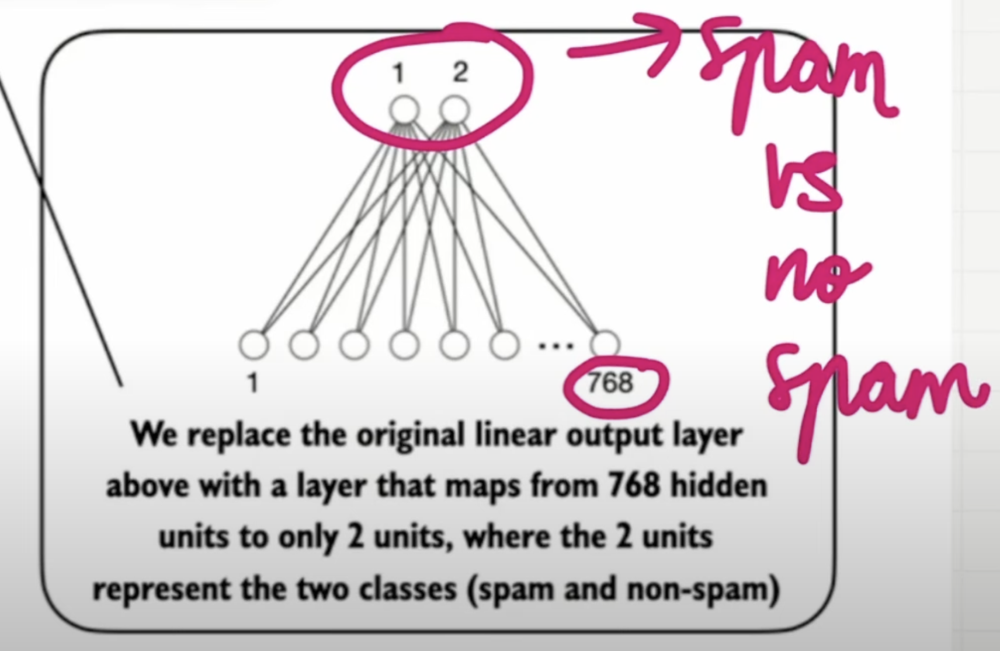

<div class="alert alert-block alert-warning">

İkili bir sınıflandırma göreviyle uğraştığımız için teknik olarak tek bir çıktı düğümü kullanabiliriz.

Ancak, bu kayıp fonksiyonunu değiştirmeyi gerektirir.

Bu nedenle, çıktı düğümü sayısının sınıf sayısıyla eşleştiği daha genel bir yaklaşım seçeriz.

Örneğin, haber makalelerini "Teknoloji", "Spor" veya "Politika" olarak sınıflandırmak gibi 3 sınıflı bir problem için üç çıktı düğümü kullanırız, vb.

</div>

<div class="alert alert-block alert-success">

Değiştirilmiş mimariyi oluşturmaya çalışmadan önce, model mimarisini print(model) aracılığıyla yazdıralım; bu da aşağıdakileri yazdırır:
    
</div>

In [32]:
print(model)


GPTModel(
  (tok_emb): Embedding(50257, 768)
  (pos_emb): Embedding(1024, 768)
  (drop_emb): Dropout(p=0.0, inplace=False)
  (trf_blocks): Sequential(
    (0): TransformerBlock(
      (att): MultiHeadAttention(
        (W_query): Linear(in_features=768, out_features=768, bias=True)
        (W_key): Linear(in_features=768, out_features=768, bias=True)
        (W_value): Linear(in_features=768, out_features=768, bias=True)
        (out_proj): Linear(in_features=768, out_features=768, bias=True)
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (ff): FeedForward(
        (layers): Sequential(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU()
          (2): Linear(in_features=3072, out_features=768, bias=True)
        )
      )
      (norm1): LayerNorm()
      (norm2): LayerNorm()
      (drop_shortcut): Dropout(p=0.0, inplace=False)
    )
    (1): TransformerBlock(
      (att): MultiHeadAttention(
        (W_query): Linear(in_features=7

<div class="alert alert-block alert-info">

Yukarıda, GPT mimarisini düzgün bir şekilde düzenlenmiş olarak görebiliriz.

Daha önce
tartışıldığı gibi, GPTModel, 12 özdeş
transformer bloğunun (kısalık için yalnızca son blok gösterilmiştir) izlediği embedding katmanlardan, ardından son bir LayerNorm'dan
ve çıkış katmanı olan out_head'den oluşur.

</div>

<div class="alert alert-block alert-success">

Daha sonra, out_head'i, Şekil 6.9'da gösterildiği gibi, finetunining yapacağımız yeni bir çıktı katmanıyla değiştiriyoruz.

</div>

<div class="alert alert-block alert-success">

Modeli classification-finetuning için hazır hale getirmek için, önce modeli donduruyoruz, yani
tüm katmanları eğitilemez hale getiriyoruz:

</div>

In [33]:
for param in model.parameters():
    param.requires_grad = False

<div class="alert alert-block alert-success">

Daha sonra, başlangıçta katman girdilerini 50.257 boyuta (sözlüğün boyutu) eşleyen çıktı katmanını (model.out_head) değiştiririz:

</div>

In [34]:
torch.manual_seed(123)

num_classes = 2
model.out_head = torch.nn.Linear(in_features=BASE_CONFIG["emb_dim"], out_features=num_classes)

<div class="alert alert-block alert-warning">

Önceki kodda, kodu daha genel tutmak için "gpt2-small (124M)" modelinde 768'e eşit olan BASE_CONFIG["emb_dim"] kullandığımızı unutmayın.

Bu, aynı kodu daha büyük GPT-2 model varyantlarıyla çalışmak için de kullanabileceğimiz anlamına gelir.

Bu yeni model.out_head çıktı katmanının requires_grad niteliği varsayılan olarak True olarak ayarlanmıştır, bu da eğitim sırasında modelde güncellenecek tek katman olduğu anlamına gelir.

</div>

<div class="alert alert-block alert-success">

Ek olarak, son transformer bloğunu ve bu bloğu çıkış katmanına bağlayan son LayerNorm modülünü eğitilebilir olacak şekilde yapılandırıyoruz
    
</div>

In [35]:
for param in model.trf_blocks[-1].parameters():
    param.requires_grad = True

for param in model.final_norm.parameters():
    param.requires_grad = True

<div class="alert alert-block alert-warning">

Yeni bir çıktı katmanı eklemiş ve belirli katmanları eğitilebilir veya eğitilemez olarak işaretlemiş olsak da, bu modeli önceki bölümlere benzer şekilde kullanabiliriz.

Örneğin,
önceki bölümlerde yaptığımız gibi, ona bir örnek metin verebiliriz.
Örneğin, aşağıdaki örnek metni ele alalım:

</div>

In [36]:
inputs = tokenizer.encode("Do you have time")
inputs = torch.tensor(inputs).unsqueeze(0)
print("Inputs:", inputs)
print("Inputs dimensions:", inputs.shape) # shape: (batch_size, num_tokens)

Inputs: tensor([[5211,  345,  423,  640]])
Inputs dimensions: torch.Size([1, 4])


<div class="alert alert-block alert-success">

Daha sonra kodlanmış token kimliklerini her zamanki gibi modele geçirebiliriz:
    
</div>

In [37]:
with torch.no_grad():
    outputs = model(inputs)

print("Outputs:\n", outputs)
print("Outputs dimensions:", outputs.shape) # shape: (batch_size, num_tokens, num_classes)

Outputs:
 tensor([[[-1.5854,  0.9904],
         [-3.7235,  7.4548],
         [-2.2661,  6.6049],
         [-3.5983,  3.9902]]])
Outputs dimensions: torch.Size([1, 4, 2])


<div class="alert alert-block alert-info">

Önceki bölümlerde, benzer bir girdi [1, 4, 50257] çıktı tensörü üretirdi,
burada 50.257 kelime dağarcığı boyutunu temsil eder.

Önceki bölümlerde olduğu gibi,
çıktı satırlarının sayısı girdi token sayısına (bu durumda 4) karşılık gelir.

Ancak, her
çıktının embedding boyutu (sütun sayısı) artık modelin çıktı katmanını değiştirdiğimizden
50.257 yerine 2'ye düşürüldü.

</div>

<div class="alert alert-block alert-warning">

Bu modeli, bir model girişinin spam olup olmadığını belirten bir sınıf etiketi döndürecek şekilde fine-tuning ile ilgilendiğimizi unutmayın.

Bunu başarmak için, 4 çıktı satırının hepsini fine-tune etmemize gerek yok ancak tek bir çıktı tokenına odaklanabiliriz.

Özellikle, son çıktı token'nına karşılık gelen son satıra odaklanacağız

</div>

<div class="alert alert-block alert-success">

Şekil 6.11'de gösterilen son çıktı tokenını çıktı tensöründen çıkarmak için şu kodu kullanırız:

</div>

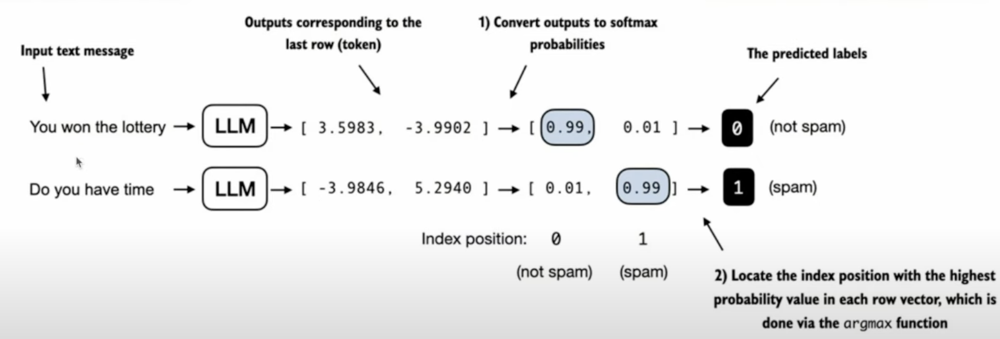

In [38]:
print("Last output token:", outputs[:, -1, :])

Last output token: tensor([[-3.5983,  3.9902]])


<div class="alert alert-block alert-info">

Modeli değiştirdikten sonra, bir sonraki bölüm son tokenı sınıf etiketi tahminlerine dönüştürme sürecini ayrıntılı olarak açıklayacak ve modelin ilk tahmin doğruluğunu hesaplayacaktır.

Bunun ardından, sonraki bölümde spam sınıflandırma görevi için modeli fine-tune edeceğiz.

</div>

## SINIFLANDIRMA KAYBININ (CLASSIFICATION LOSS) VE DOĞRULUĞUNUN (ACCURACY) HESAPLANMASI

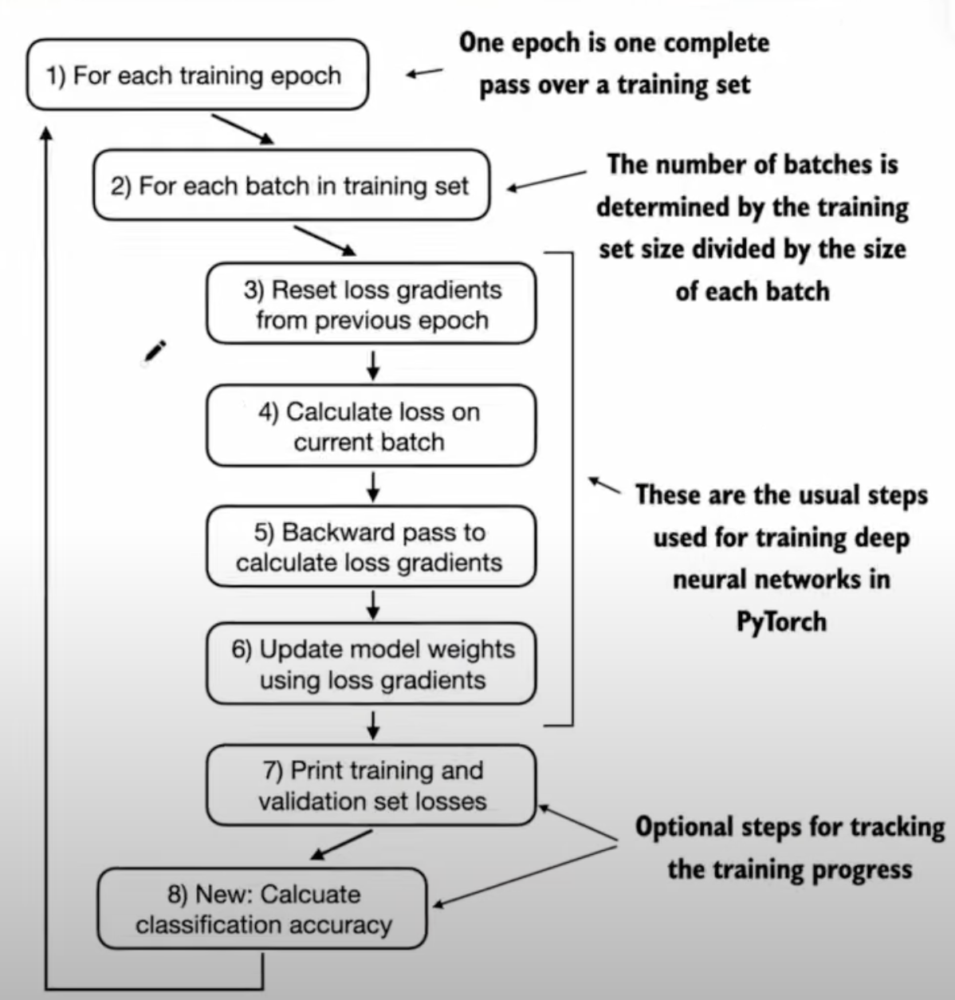

<div class="alert alert-block alert-success">

Bu bölümde şimdiye kadar veri setini hazırladık, önceden eğitilmiş bir model yükledik ve
classification-finetuning ayarı için değiştirdik.

Finetuning kendisine geçmeden önce, geriye sadece
küçük bir kısım kaldı: fine-tuning sırasında kullanılan model değerlendirme işlevlerini uygulamak,
</div>

<div class="alert alert-block alert-success">

Değerlendirme yardımcı programlarını uygulamadan önce, model çıktılarını sınıf etiketi tahminlerine nasıl dönüştürdüğümüzü kısaca tartışalım.
</div>

<div class="alert alert-block alert-warning">

Önceki bölümde, LLM tarafından üretilen bir sonraki token'ın token kimliğini, softmax fonksiyonu aracılığıyla 50.257 çıktıyı olasılıklara dönüştürerek ve ardından argmax fonksiyonu aracılığıyla en yüksek olasılığın konumunu döndürerek hesapladık.

Bu bölümde, modelin belirli bir girdi için "spam" veya "spam değil" tahmini yapıp yapmayacağını hesaplamak için aynı yaklaşımı benimsiyoruz, tek fark 50.257 boyutlu çıktılar yerine 2 boyutlu çıktılarla çalışmamız.
    
</div>

<div class="alert alert-block alert-success">

Önceki bölümdeki son token çıktısını ele alalım:
</div>

In [39]:
print("Last output token:", outputs[:, -1, :])

Last output token: tensor([[-3.5983,  3.9902]])


<div class="alert alert-block alert-success">
Sınıf etiketini aşağıdaki kodla elde edebiliriz:
</div>

In [40]:
probas = torch.softmax(outputs[:, -1, :], dim=-1)
label = torch.argmax(probas)
print("Class label:", label.item())

Class label: 1


<div class="alert alert-block alert-info">

Bu durumda, kod 1 döndürür, yani model giriş metninin "spam" olduğunu tahmin eder.

Burada softmax işlevini kullanmak isteğe bağlıdır çünkü en büyük çıktılar doğrudan en yüksek olasılık puanlarına karşılık gelir.

Bu nedenle, softmax kullanmadan kodu şu şekilde basitleştirebiliriz:

</div>

In [41]:
logits = outputs[:, -1, :]
label = torch.argmax(logits)
print("Class label:", label.item())

Class label: 1


<div class="alert alert-block alert-success">
Bu kavram, bir veri kümesindeki doğru tahminlerin yüzdesini ölçen sözde sınıflandırma doğruluğunu hesaplamak için kullanılabilir.
</div>

<div class="alert alert-block alert-success">
Sınıflandırma doğruluğunu belirlemek için, argmax tabanlı tahmin kodunu veri kümesindeki tüm örneklere uygularız ve bir calc_accuracy_loader fonksiyonu tanımlayarak doğru tahminlerin oranını hesaplarız:
</div>

In [42]:
def calc_accuracy_loader(data_loader, model, device, num_batches=None):
    model.eval()
    correct_predictions, num_examples = 0, 0

    if num_batches is None:
        num_batches = len(data_loader)
    else:
        num_batches = min(num_batches, len(data_loader))
    for i, (input_batch, target_batch) in enumerate(data_loader):
        if i < num_batches:
            input_batch, target_batch = input_batch.to(device), target_batch.to(device)

            with torch.no_grad():
                logits = model(input_batch)[:, -1, :]  # Son çıktı belirtecinin lojikleri
            predicted_labels = torch.argmax(logits, dim=-1)

            num_examples += predicted_labels.shape[0]
            correct_predictions += (predicted_labels == target_batch).sum().item()
        else:
            break
    return correct_predictions / num_examples

<div class="alert alert-block alert-success">
Verimlilik için 10 gruptan tahmin edilen çeşitli veri kümeleri arasında sınıflandırma doğruluklarını belirlemek için işlevi kullanalım:
</div>

In [43]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Not:
# Aşağıdaki satırların yorumunu kaldırmak, kodun Apple Silicon yongalarında çalışmasına izin verecektir, eğer uygulanabilirse,
# bu da bir Apple CPU'dan (bir M3 MacBook Air'de ölçüldüğü gibi) yaklaşık 2 kat daha hızlıdır.
# Bu yazının yazıldığı tarih itibarıyla, PyTorch 2.4'te CPU ve MPS aracılığıyla elde edilen sonuçlar aynıydı.
# Ancak, PyTorch'un önceki sürümlerinde, MPS kullanırken farklı sonuçlar gözlemleyebilirsiniz.

if torch.cuda.is_available():
   device = torch.device("cuda")
elif torch.backends.mps.is_available():
   device = torch.device("mps")
else:
   device = torch.device("cpu")
print(f"Running on {device} device.")

model.to(device) # no assignment model = model.to(device) necessary for nn.Module classes

torch.manual_seed(123) # Eğitim veri yükleyicisindeki karıştırma nedeniyle yeniden üretilebilirlik için

train_accuracy = calc_accuracy_loader(train_loader, model, device, num_batches=10)
val_accuracy = calc_accuracy_loader(val_loader, model, device, num_batches=10)
test_accuracy = calc_accuracy_loader(test_loader, model, device, num_batches=10)

print(f"Training accuracy: {train_accuracy*100:.2f}%")
print(f"Validation accuracy: {val_accuracy*100:.2f}%")
print(f"Test accuracy: {test_accuracy*100:.2f}%")

Running on mps device.
Training accuracy: 46.25%
Validation accuracy: 45.00%
Test accuracy: 48.75%


<div class="alert alert-block alert-info">
    
Gördüğümüz gibi, tahmin doğrulukları rastgele bir tahmine yakın vve yaklaşık olarak
%50'dir.

Tahmin doğruluklarını iyileştirmek için modeli finetune etmemiz gerekiyor.

</div>

<div class="alert alert-block alert-warning">

Sınıflandırma doğruluğu türevlenebilir bir fonksiyon değildir, bu nedenle doğruluğu en üst düzeye çıkarmak için bir vekil olarak çapraz entropi kaybını (cross entropy
loss) kullanırız.

Buna göre, calc_loss_batch fonksiyonu daha öncekiyle aynı kalır, ancak bir
ayarlamayla: tüm tokenlar, model(input_batch) yerine yalnızca son token'ı, model(input_batch)[:, -1, :],
en iyi duruma getirmeye odaklanırız:

</div>

In [44]:
def calc_loss_batch(input_batch, target_batch, model, device):
    input_batch, target_batch = input_batch.to(device), target_batch.to(device)
    logits = model(input_batch)[:, -1, :]  # Son çıktı tokenının lojiği
    loss = torch.nn.functional.cross_entropy(logits, target_batch)
    return loss

<div class="alert alert-block alert-success">
Daha önce tanımlanmış dataloader'dan elde edilen tek bir batch için kaybı hesaplamak amacıyla calc_loss_batch işlevini kullanırız. Bir veri yükleyicisindeki tüm batch işler için kaybı hesaplamak amacıyla calc_loss_loader işlevini tanımlarız
</div>

In [45]:
def calc_loss_loader(data_loader, model, device, num_batches=None):
    total_loss = 0.
    if len(data_loader) == 0:
        return float("nan")
    elif num_batches is None:
        num_batches = len(data_loader)
    else:
        # Veri yükleyicisindeki toplam batch sayısına uyacak şekilde batch sayısını azaltın
        # num_batches veri yükleyicisindeki batch sayısını aşarsa
        num_batches = min(num_batches, len(data_loader))
    for i, (input_batch, target_batch) in enumerate(data_loader):
        if i < num_batches:
            loss = calc_loss_batch(input_batch, target_batch, model, device)
            total_loss += loss.item()
        else:
            break
    return total_loss / num_batches

<div class="alert alert-block alert-success">
Eğitim doğruluğunu hesaplamaya benzer şekilde, şimdi her veri kümesi için başlangıç ​​kaybını hesaplıyoruz:
</div>

In [46]:
with torch.no_grad(): # Verimlilik için traning'i devre dışı bırakın çünkü henüz eğitim vermiyoruz
    train_loss = calc_loss_loader(train_loader, model, device, num_batches=5)
    val_loss = calc_loss_loader(val_loader, model, device, num_batches=5)
    test_loss = calc_loss_loader(test_loader, model, device, num_batches=5)

print(f"Training loss: {train_loss:.3f}")
print(f"Validation loss: {val_loss:.3f}")
print(f"Test loss: {test_loss:.3f}")

Training loss: 2.453
Validation loss: 2.583
Test loss: 2.322


<div class="alert alert-block alert-success">

Bir sonraki bölümde, modeli finetune etmek için bir eğitim fonksiyonu uygulayacağız, bu da eğitim seti kaybını en aza indirmek için modeli ayarlamak anlamına gelir.

Eğitim seti kaybını en aza indirmek, genel hedefimiz olan sınıflandırma doğruluğunu (classification accuracy) artırmaya yardımcı olacaktır.
</div>

## FINETUNING THE MODEL ON SUPERVISED DATA

<div class="alert alert-block alert-success">

Bu bölümde, önceden eğitilmiş LLM'yi finetune etmek ve spam sınıflandırma doğruluğunu iyileştirmek için eğitim işlevini tanımlayıp kullanıyoruz.

Eğitim döngüsü, daha önce kullandığımız genel eğitim döngüsüyle aynıdır; tek fark, modeli değerlendirmek için örnek bir metin oluşturmak yerine sınıflandırma doğruluğunu (classification accuracy) hesaplamamızdır.

</div>

<div class="alert alert-block alert-success">

Eğitim fonksiyonu ayrıca daha önce modeli önceden eğitmek için kullanılan train_model_simple fonksiyonunu yakından yansıtır.

Tek iki fark, artık token sayısı yerine görülen eğitim örneklerinin sayısını (examples_seen) izlememiz ve örnek bir metin yazdırmak yerine her
epoch'dan sonra doğruluğu hesaplamamızdır:

</div>

<div class="alert alert-block alert-info">
    
Adım 1: Modeli eğitim moduna ayarlayın

Adım 2: Önceki batch iterasyondan kayıp gradyanlarını sıfırlayın

Adım 3: Kayıp gradyanlarını hesaplayın

Adım 4: Kayıp gradyanlarını kullanarak model ağırlıklarını güncelleyin

Adım 5: Yeni: Token yerine örnekleri izleyin

Adım 6: İsteğe bağlı değerlendirme adımı

Adım 7: Her epoch'dan sonra doğruluğu hesaplayın

</div>

In [47]:
def train_classifier_simple(model, train_loader, val_loader, optimizer, device, num_epochs,
                            eval_freq, eval_iter):
    # Kayıpları ve görülen örnekleri izlemek için listeleri başlatın
    train_losses, val_losses, train_accs, val_accs = [], [], [], []
    examples_seen, global_step = 0, -1

    # Training süreci
    for epoch in range(num_epochs):
        model.train()  # Modeli training moduna set et

        for input_batch, target_batch in train_loader:
            optimizer.zero_grad() # Önceki batch yinelemeden kayıp gradyanlarını sıfırla
            loss = calc_loss_batch(input_batch, target_batch, model, device)
            loss.backward() # Loss gradyanları hesapla
            optimizer.step() # Loss gradyanları kullanarak modeli güncelle
            examples_seen += input_batch.shape[0] # New: tokenlar yerine örnekleri takip edin
            global_step += 1

            # Opsiyonel değerlendirme adımı
            if global_step % eval_freq == 0:
                train_loss, val_loss = evaluate_model(
                    model, train_loader, val_loader, device, eval_iter)
                train_losses.append(train_loss)
                val_losses.append(val_loss)
                print(f"Ep {epoch+1} (Step {global_step:06d}): "
                      f"Train loss {train_loss:.3f}, Val loss {val_loss:.3f}")

        # Her epoch'da sonra accuracy hesapla
        train_accuracy = calc_accuracy_loader(train_loader, model, device, num_batches=eval_iter)
        val_accuracy = calc_accuracy_loader(val_loader, model, device, num_batches=eval_iter)
        print(f"Training accuracy: {train_accuracy*100:.2f}% | ", end="")
        print(f"Validation accuracy: {val_accuracy*100:.2f}%")
        train_accs.append(train_accuracy)
        val_accs.append(val_accuracy)

    return train_losses, val_losses, train_accs, val_accs, examples_seen

In [48]:
def evaluate_model(model, train_loader, val_loader, device, eval_iter):
    model.eval()
    with torch.no_grad():
        train_loss = calc_loss_loader(train_loader, model, device, num_batches=eval_iter)
        val_loss = calc_loss_loader(val_loader, model, device, num_batches=eval_iter)
    model.train()
    return train_loss, val_loss

<div class="alert alert-block alert-success">

Sonra, optimize ediciyi başlatırız, eğitim epoch'larının sayısını ayarlarız ve train_classifier_simple fonksiyonunu kullanarak eğitimi başlatırız.

Sonuçları değerlendirdikten sonra eğitim epoch sayısının seçimini tartışacağız.

Eğitim, bir M3 MacBook Air dizüstü bilgisayarda yaklaşık 6 dakika ve bir V100 veya A100 GPU'da yarım dakikadan az sürer:

</div>

In [49]:
import time

start_time = time.time()

torch.manual_seed(123)

optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5, weight_decay=0.1)

num_epochs = 5
train_losses, val_losses, train_accs, val_accs, examples_seen = train_classifier_simple(
    model, train_loader, val_loader, optimizer, device,
    num_epochs=num_epochs, eval_freq=50, eval_iter=5,
)

end_time = time.time()
execution_time_minutes = (end_time - start_time) / 60
print(f"Training completed in {execution_time_minutes:.2f} minutes.")

Ep 1 (Step 000000): Train loss 2.153, Val loss 2.392
Ep 1 (Step 000050): Train loss 0.617, Val loss 0.637
Ep 1 (Step 000100): Train loss 0.523, Val loss 0.557
Training accuracy: 70.00% | Validation accuracy: 72.50%
Ep 2 (Step 000150): Train loss 0.561, Val loss 0.489
Ep 2 (Step 000200): Train loss 0.419, Val loss 0.397
Ep 2 (Step 000250): Train loss 0.409, Val loss 0.353
Training accuracy: 82.50% | Validation accuracy: 85.00%
Ep 3 (Step 000300): Train loss 0.333, Val loss 0.320
Ep 3 (Step 000350): Train loss 0.340, Val loss 0.306
Training accuracy: 90.00% | Validation accuracy: 90.00%
Ep 4 (Step 000400): Train loss 0.136, Val loss 0.200
Ep 4 (Step 000450): Train loss 0.153, Val loss 0.132
Ep 4 (Step 000500): Train loss 0.222, Val loss 0.137
Training accuracy: 100.00% | Validation accuracy: 97.50%
Ep 5 (Step 000550): Train loss 0.207, Val loss 0.143
Ep 5 (Step 000600): Train loss 0.083, Val loss 0.074
Training accuracy: 100.00% | Validation accuracy: 97.50%
Training completed in 2.49 mi

<div class="alert alert-block alert-success">

Daha sonra eğitim ve doğrulama kümesi için kayıp fonksiyonunu çizmek üzere matplotlib'i kullanırız:
    
</div>

In [50]:
import matplotlib.pyplot as plt

def plot_values(epochs_seen, examples_seen, train_values, val_values, label="loss"):
    fig, ax1 = plt.subplots(figsize=(5, 3))

    # Dönemlere göre eğitim ve doğrulama kaybını çizin
    ax1.plot(epochs_seen, train_values, label=f"Training {label}")
    ax1.plot(epochs_seen, val_values, linestyle="-.", label=f"Validation {label}")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel(label.capitalize())
    ax1.legend()

    # Görülen örnekler için ikinci bir x ekseni oluşturun
    ax2 = ax1.twiny()  # Aynı y eksenini paylaşan ikinci bir x ekseni oluşturun
    ax2.plot(examples_seen, train_values, alpha=0)  # Görünmez çizim
    ax2.set_xlabel("Examples seen")

    fig.tight_layout()  # Düzenle
    plt.savefig(f"{label}-plot.pdf")
    plt.show()

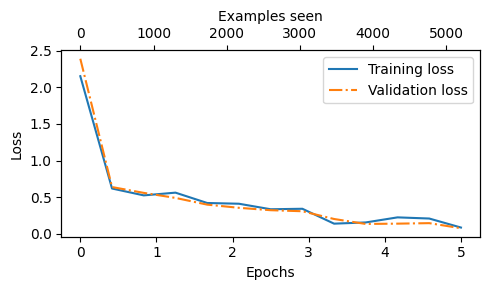

In [51]:
epochs_tensor = torch.linspace(0, num_epochs, len(train_losses))
examples_seen_tensor = torch.linspace(0, examples_seen, len(train_losses))

plot_values(epochs_tensor, examples_seen_tensor, train_losses, val_losses)

<div class="alert alert-block alert-info">
    
Keskin aşağı doğru eğime dayanarak görebileceğimiz gibi, model eğitim verilerinden iyi öğreniyor ve aşırı uyum olduğuna dair çok az veya hiç belirti yok; yani, eğitim ve doğrulama seti kayıpları arasında fark edilir bir boşluk yok).

</div>

<div class="alert alert-block alert-success">

Aynı plot_values ​​fonksiyonunu kullanarak şimdi sınıflandırma doğruluklarını da çizelim:

</div>

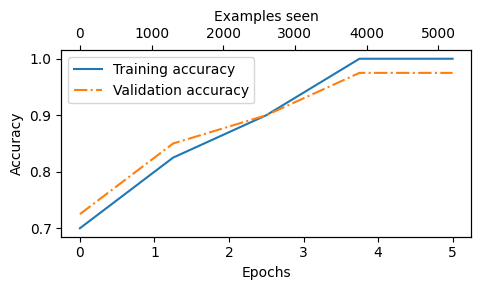

In [52]:
epochs_tensor = torch.linspace(0, num_epochs, len(train_accs))
examples_seen_tensor = torch.linspace(0, examples_seen, len(train_accs))

plot_values(epochs_tensor, examples_seen_tensor, train_accs, val_accs, label="accuracy")

<div class="alert alert-block alert-info">

Şekil'deki doğruluk grafiğine göre, model 4. ve 5. dönemlerden sonra nispeten yüksek bir eğitim ve doğrulama doğruluğu elde eder.

Ancak, daha önce train_classifier_simple işlevini kullanırken eval_iter=5 olarak ayarladığımızı belirtmek önemlidir; bu, eğitim ve doğrulama performansı tahminlerimizin eğitim sırasında verimlilik için yalnızca 5 batch'e dayandığı anlamına gelir.

Şimdi, bu sefer eval_iter değerini tanımlamadan, aşağıdaki kodu çalıştırarak tüm veri kümesi boyunca eğitim, doğrulama ve test kümeleri için performans ölçümlerini hesaplayacağız:

</div>

In [53]:
train_accuracy = calc_accuracy_loader(train_loader, model, device)
val_accuracy = calc_accuracy_loader(val_loader, model, device)
test_accuracy = calc_accuracy_loader(test_loader, model, device)

print(f"Training accuracy: {train_accuracy*100:.2f}%")
print(f"Validation accuracy: {val_accuracy*100:.2f}%")
print(f"Test accuracy: {test_accuracy*100:.2f}%")

Training accuracy: 97.21%
Validation accuracy: 97.32%
Test accuracy: 95.67%


<div class="alert alert-block alert-warning">

Eğitim ve test seti performansları neredeyse aynıdır.

Eğitim ve test seti doğrulukları arasındaki ufak bir tutarsızlık, eğitim verilerinin minimal düzeyde aşırı uyum sağladığını gösterir.

Genellikle, doğrulama seti doğruluğu test seti doğruluğundan biraz daha yüksektir çünkü model geliştirme genellikle doğrulama setinde iyi performans gösterecek şekilde hiperparametrelerin ayarlanmasını içerir ve bu da test setine o kadar etkili bir şekilde genelleştirilemeyebilir.

Bu durum yaygındır, ancak modelin ayarlarını düzenleyerek, örneğin optimizatör yapılandırmasındaki dropout oranını (drop_rate) veya weight_decay
parametresini artırarak boşluk potansiyel olarak en aza indirilebilir.

</div>

## LLM'yi SPAM SINIFLANDIRICI OLARAK KULLANMA

<div class="alert alert-block alert-success">

Önceki bölümlerde modeli finetune edip değerlendirdikten sonra, artık bu bölümün son aşamasındayız: modeli spam mesajlarını sınıflandırmak için kullanmak.

</div>

<div class="alert alert-block alert-success">

Son olarak, finetune edilmiş GPT tabanlı spam sınıflandırma modelini kullanalım.

Aşağıdaki classify_review işlevi, bu bölümün önceki kısımlarında uyguladığımız
SpamDataset'te kullandığımızlara benzer veri ön işleme adımlarını izler.

Ve sonra, metni token kimliklerine işledikten sonra, işlev, daha önce uyguladığımıza benzer şekilde bir tamsayı sınıf etiketini tahmin etmek için modeli kullanır ve ardından karşılık gelen sınıf adını döndürür:
</div>

<div class="alert alert-block alert-info">
    
Adım 1: Modele girdileri hazırlayın

Adım 2: Çok uzunlarsa dizileri kesin

Adım 3: Dizileri en uzun diziye yerleştirin

Adım 4: Batch boyutu ekleyin

Adım 5: Gradyan izleme olmadan model çıkarımı

Adım 6: Son çıktı belirtecinin lojikleri

Adım 7: Sınıflandırılmış sonucu döndürün

</div>

In [54]:
def classify_review(text, model, tokenizer, device, max_length=None, pad_token_id=50256):
    model.eval()

    # Model girdilerini ayarla
    input_ids = tokenizer.encode(text)
    supported_context_length = model.pos_emb.weight.shape[0]
    
    # Eğer çok uzunsa diizeyi kes
    input_ids = input_ids[:min(max_length, supported_context_length)]

    # Diziyi daha uzun dizeye doldurun
    input_ids += [pad_token_id] * (max_length - len(input_ids))
    input_tensor = torch.tensor(input_ids, device=device).unsqueeze(0) # add batch dimension

    # Model inference
    with torch.no_grad():
        logits = model(input_tensor)[:, -1, :]  # Logits of the last output token
    predicted_label = torch.argmax(logits, dim=-1).item()

    # Sınıflandırılmış sonuçları döndürün
    return "spam" if predicted_label == 1 else "not spam"

<div class="alert alert-block alert-success">

Bu classify_review fonksiyonunu bir örnek metin üzerinde deneyelim:

</div>

In [55]:
text_1 = (
    "You are a winner you have been specially"
    " selected to receive $1000 cash or a $2000 award."
)

print(classify_review(
    text_1, model, tokenizer, device, max_length=train_dataset.max_length
))

spam


<div class="alert alert-block alert-info">
    
Ortaya çıkan model "spam"i doğru bir şekilde tahmin ediyor.

</div>

In [56]:
text_2 = (
    "Hey, just wanted to check if we're still on"
    " for dinner tonight? Let me know!"
)

print(classify_review(
    text_2, model, tokenizer, device, max_length=train_dataset.max_length
))

not spam


<div class="alert alert-block alert-info">
    
Burada da model doğru bir tahminde bulunup "spam değil" etiketi döndürüyor.

</div>

<div class="alert alert-block alert-success">

Son olarak, modeli daha sonra torch.save metodunu kullanarak tekrar eğitmek zorunda kalmadan tekrar kullanmak istersek diye modeli kaydedelim.

</div>

In [57]:
torch.save(model.state_dict(), "review_classifier.pth")


<div class="alert alert-block alert-success">

Kaydedildikten sonra model aşağıdaki şekilde yüklenebilir:

</div>

In [58]:
model_state_dict = torch.load("review_classifier.pth")
model.load_state_dict(model_state_dict)

<All keys matched successfully>

# INSTRUCTION FINE-TUNING

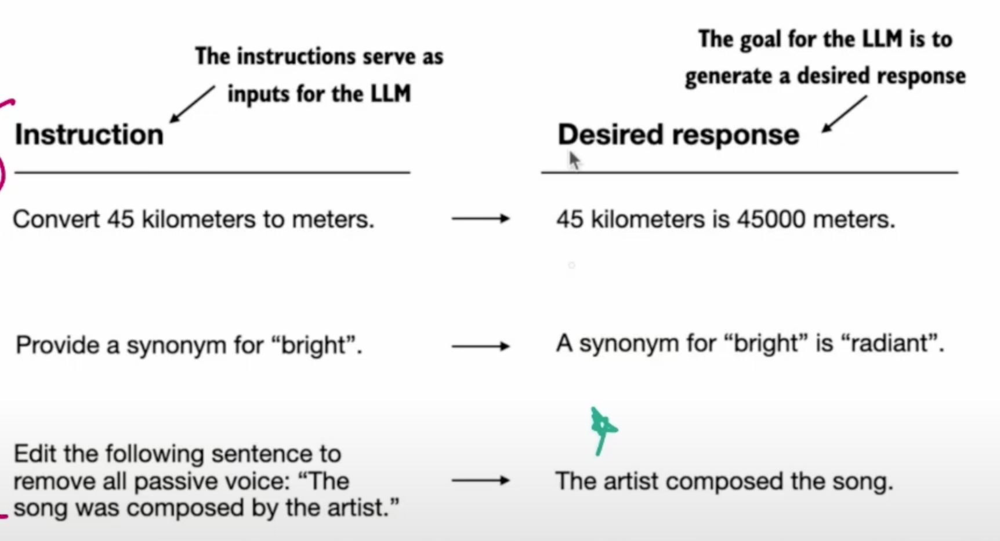

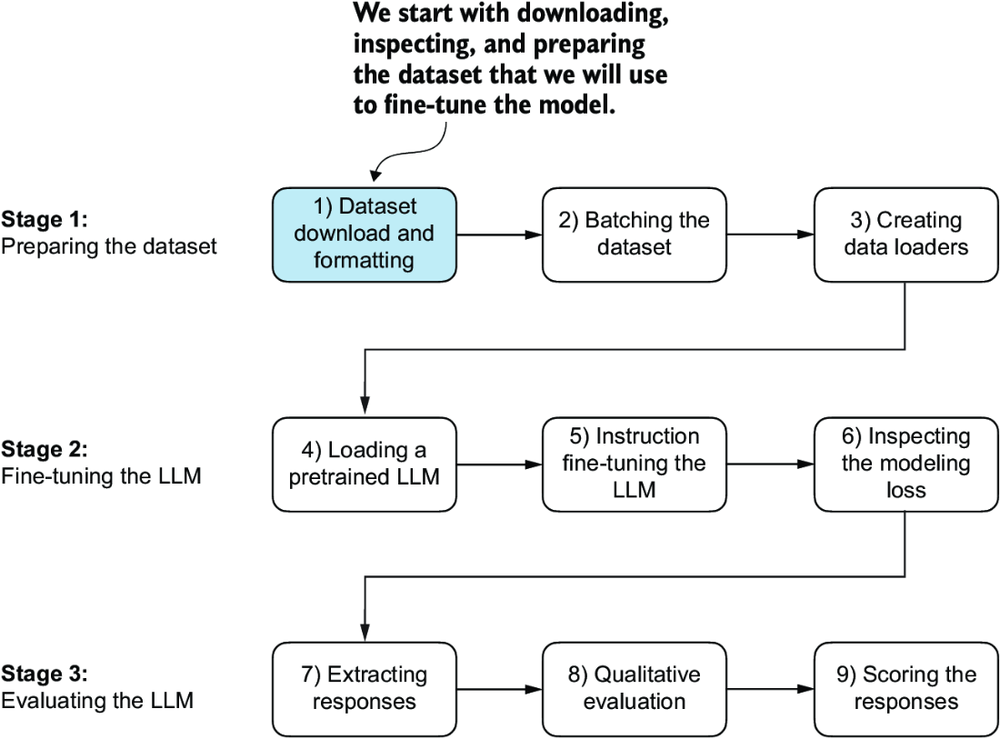

## ADIM 1: DATASET HAZIRLANMASI

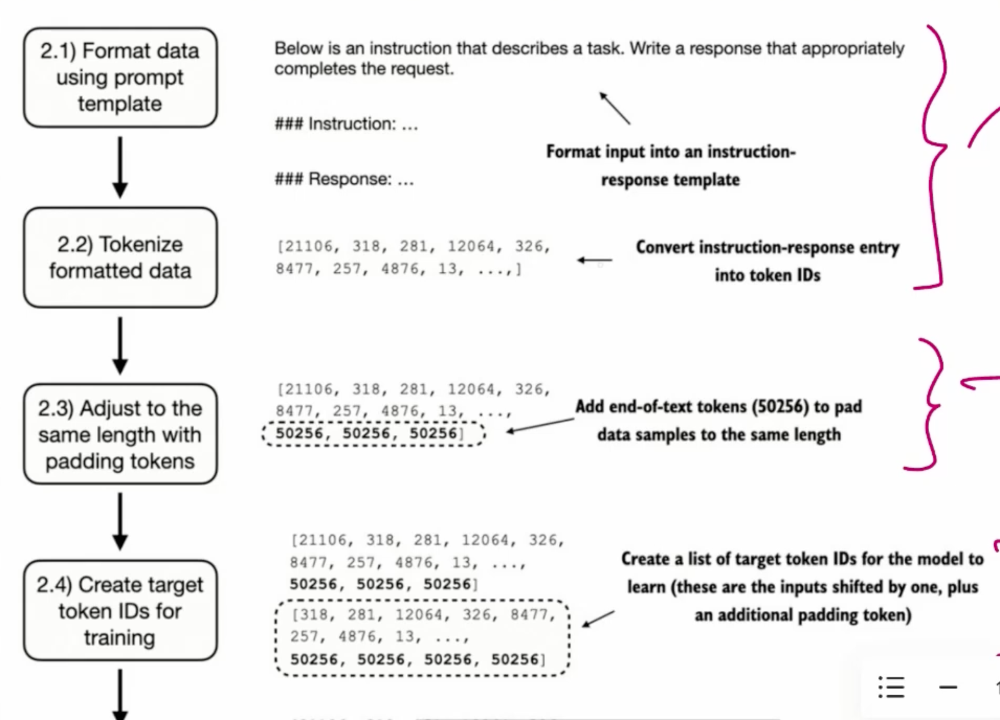

<div class="alert alert-block alert-success">

Bu bölümde önceden eğitilmiş bir LLM'de instruction finetuning için instruction veri kümesini indirip biçimlendiriyoruz. Veri kümesi 1100 talimat-yanıt çiftinden oluşur.

Aşağıdaki kod, bu veri kümesini indirmek için bir işlevi uygular ve yürütür; bu, yalnızca 204 KB boyutunda, JSON biçiminde nispeten küçük bir dosyadır. JSON veya JavaScript Nesne Gösterimi, Python sözlüklerinin yapısını yansıtır ve hem insan tarafından okunabilen hem de makine dostu olan veri alışverişi için basit bir yapı sağlar.

</div>

In [59]:
import json
import os
import urllib
import ssl

def download_and_load_file(file_path, url):
    ssl_context = ssl.create_default_context()
    ssl_context.check_hostname = False
    ssl_context.verify_mode = ssl.CERT_NONE

    if not os.path.exists(file_path):
        with urllib.request.urlopen(url, context=ssl_context) as response:
            text_data = response.read().decode("utf-8")
        with open(file_path, "w", encoding="utf-8") as file:
            file.write(text_data)
    else:
        with open(file_path, "r", encoding="utf-8") as file:
            text_data = file.read()

    with open(file_path, "r", encoding="utf-8") as file:
        data = json.load(file)

    return data


file_path = "data/instruction-data.json"
url = (
    "https://raw.githubusercontent.com/rasbt/LLMs-from-scratch"
    "/main/ch07/01_main-chapter-code/instruction-data.json"
)

data = download_and_load_file(file_path, url)
print("Number of entries:", len(data))


Number of entries: 1100


<div class="alert alert-block alert-success">

JSON dosyasından yüklediğimiz veri listesi, talimat veri kümesinin 1100 girişini içerir.

Her girişin nasıl yapılandırıldığını görmek için girişlerden birini yazdıralım:

</div>

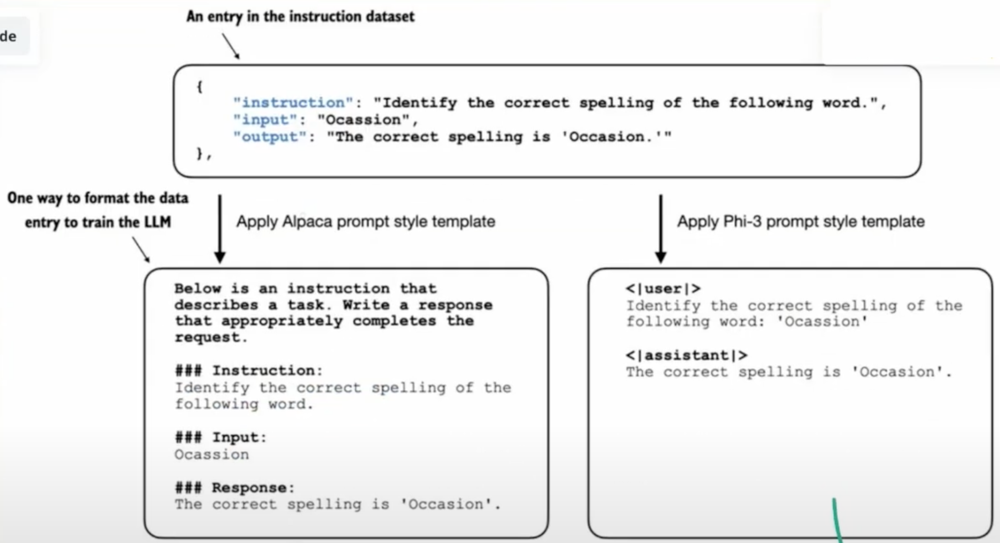

In [60]:
print("Example entry:\n", data[50])

Example entry:
 {'instruction': 'Identify the correct spelling of the following word.', 'input': 'Ocassion', 'output': "The correct spelling is 'Occasion.'"}


In [61]:
print("Another example entry:\n", data[999])

Another example entry:
 {'instruction': "What is an antonym of 'complicated'?", 'input': '', 'output': "An antonym of 'complicated' is 'simple'."}


### TALİMATLARI ALPAKA FORMATINA DÖNÜŞTÜRME

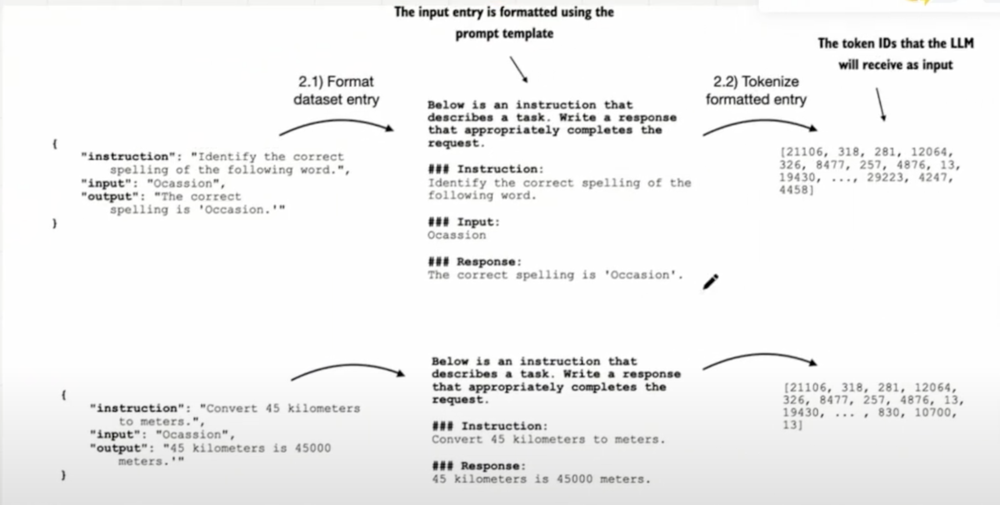

In [62]:
def format_input(entry):
    instruction_text = (
        f"Below is an instruction that describes a task. "
        f"Write a response that appropriately completes the request."
        f"\n\n### Instruction:\n{entry['instruction']}"
    )

    input_text = f"\n\n### Input:\n{entry['input']}" if entry["input"] else ""

    return instruction_text + input_text

<div class="alert alert-block alert-info">
    
Bu format_input fonksiyonu girdi olarak bir sözlük girdisi alır ve biçimlendirilmiş bir dize oluşturur.

</div>

<div class="alert alert-block alert-success">

Daha önce incelediğimiz veri kümesi giriş verileri[50] üzerinde test edelim:

</div>

In [63]:
model_input = format_input(data[50])
desired_response = f"\n\n### Response:\n{data[50]['output']}"

print(model_input + desired_response)

Below is an instruction that describes a task. Write a response that appropriately completes the request.

### Instruction:
Identify the correct spelling of the following word.

### Input:
Ocassion

### Response:
The correct spelling is 'Occasion.'


<div class="alert alert-block alert-warning">

format_input'un 'input' alanı boşsa isteğe bağlı ### Input: bölümünü atladığını unutmayın; bunu daha önce incelediğimiz giriş data[999]'a format_input işlevini uygulayarak test edebiliriz:

</div>

In [64]:
model_input = format_input(data[999])
desired_response = f"\n\n### Response:\n{data[999]['output']}"

print(model_input + desired_response)

Below is an instruction that describes a task. Write a response that appropriately completes the request.

### Instruction:
What is an antonym of 'complicated'?

### Response:
An antonym of 'complicated' is 'simple'.


### VERİ SETİNİ EĞİTİM-TEST-DOĞRULAMA OLARAK AYIRMA

In [65]:
train_portion = int(len(data) * 0.85)  # 85% for training
test_portion = int(len(data) * 0.1)    # 10% for testing
val_portion = len(data) - train_portion - test_portion  # Remaining 5% for validation

train_data = data[:train_portion]
test_data = data[train_portion:train_portion + test_portion]
val_data = data[train_portion + test_portion:]

In [66]:
print("Training set length:", len(train_data))
print("Validation set length:", len(val_data))
print("Test set length:", len(test_data))

Training set length: 935
Validation set length: 55
Test set length: 110


<div class="alert alert-block alert-warning">

Veri setini başarıyla indirip bölümledikten ve veri seti istemi biçimlendirmesi hakkında net bir anlayış kazandıktan sonra, artık instruction finetuning sürecinin temel uygulamasına hazırız.

</div>

## ADIM 2: VERİLERİN EĞİTİM BATCH'LERİNE DÜZENLENMESİ

<div class="alert alert-block alert-success">

Önceki bölümde, eğitim batchleri, örnek listelerini batchlere birleştirmek için varsayılan bir sıralama işlevi kullanan PyTorch
DataLoader sınıfı tarafından otomatik olarak oluşturuldu.

Bir sıralama işlevi, bireysel veri örneklerinin bir listesini alıp bunları eğitim sırasında model tarafından verimli bir şekilde işlenebilecek tek bir batchde birleştirmekten sorumludur.

</div>

<div class="alert alert-block alert-warning">

Ancak, bu bölümdeki instruction-finetuning için batch işlem süreci biraz daha karmaşıktır ve daha sonra DataLoader'a takacağımız kendi özel sıralama işlevimizi oluşturmamızı gerektirir.

Bu özel sıralama işlevini, instruction-finetuning veri kümemizin özel gereksinimlerini ve biçimlendirmesini ele almak için uygularız.

</div>

<div class="alert alert-block alert-success">

Öncelikle, önceki bölümdeki format_input'u uygulayan ve veri setindeki tüm girdileri 6. bölümdeki SpamDataset'e benzer şekilde önceden belirteçleyen bir
InstructionDataset sınıfı kodluyoruz.

</div>

In [67]:
import torch
from torch.utils.data import Dataset


class InstructionDataset(Dataset):
    def __init__(self, data, tokenizer):
        self.data = data

        # Pre-tokenize texts
        self.encoded_texts = []
        for entry in data:
            instruction_plus_input = format_input(entry)
            response_text = f"\n\n### Response:\n{entry['output']}"
            full_text = instruction_plus_input + response_text
            self.encoded_texts.append(
                tokenizer.encode(full_text)
            )

    def __getitem__(self, index):
        return self.encoded_texts[index]

    def __len__(self):
        return len(self.data)

<div class="alert alert-block alert-warning">

Altıncı bölümdeki yaklaşıma benzer şekilde, bir grupta birden fazla eğitim örneği toplayarak eğitimi hızlandırmayı hedefliyoruz; bu da tüm girdileri benzer bir uzunluğa getirmeyi gerektirir.

Önceki bölümde olduğu gibi, <|endoftext|> tokenını bir padding tokenı olarak kullanıyoruz.

<|endoftext|> tokenını metin girdilerine eklemek yerine, belirteç kimliğini doğrudan önceden belirteçlenmiş girdilere ekleyebiliriz.

Hangi token kimliğini kullanmamız gerektiğini hatırlatmak için, tokenizer .encode yöntemini bir <|endoftext|> belirtecinde kullanabiliriz:

</div>

In [68]:
import tiktoken
tokenizer = tiktoken.get_encoding("gpt2")

print(tokenizer.encode("<|endoftext|>", allowed_special={"<|endoftext|>"}))

[50256]


<div class="alert alert-block alert-warning">

Altıncı bölümde, bir veri kümesindeki tüm örnekleri aynı uzunluğa getirdik.

Devam edersek, burada veri yükleyiciye geçirebileceğimiz özel bir
birleştirme işlevi geliştirerek daha sofistike bir yaklaşım benimsiyoruz.

Bu özel birleştirme işlevi, her gruptaki eğitim örneklerini aynı uzunluğa sahip olacak şekilde doldururken, farklı grupların farklı uzunluklara sahip olmasına izin verir.

Bu yaklaşım, yalnızca her gruptaki en uzun olanla eşleşecek şekilde dizileri genişleterek gereksiz
birleştirmeyi en aza indirir, tüm veri kümesiyle değil.

</div>

<div class="alert alert-block alert-success">

Dolgu işlemini özel bir collate fonksiyonuyla şu şekilde uygulayabiliriz:

</div>

<div class="alert alert-block alert-info">
    
Adım 1: Toplu işteki en uzun diziyi bulun

Adım 2: Girişleri doldurun ve hazırlayın

Adım 3: Daha önce eklenen ekstra doldurulmuş belirteci kaldırın

Adım 4: Giriş listesini tensöre dönüştürün ve hedef cihaza aktarın

</div>

In [69]:
def custom_collate_draft_1(
    batch,
    pad_token_id=50256,
    device="cpu"
):
    # Batch'deki en uzun diziyi bulun
    # ve maksimum uzunluğu +1 artırın, bu da aşağıya bir ekstra
    # padding token ekleyecektir
    batch_max_length = max(len(item)+1 for item in batch)

    # Padle ve inputları ayarla
    inputs_lst = []

    for item in batch:
        new_item = item.copy()
        # <|endoftext|> token ekle
        new_item += [pad_token_id]
        # Dizileri batch_max_length'e göre padle
        padded = (
            new_item + [pad_token_id] *
            (batch_max_length - len(new_item))
        )
        # padded[:-1] aracılığıyla, batch_max_length'teki +1 ayarıyla eklenen 
        # ekstra pad belirteci kaldırıyoruz.
        inputs = torch.tensor(padded[:-1])
        inputs_lst.append(inputs)

    # Giriş listesini tensöre dönüştür ve hedef cihaza aktar
    inputs_tensor = torch.stack(inputs_lst).to(device)
    return inputs_tensor

<div class="alert alert-block alert-info">
    
Uyguladığımız custom_collate_draft_1, bir PyTorch
DataLoader'a entegre edilmek üzere tasarlanmıştır, ancak bağımsız bir araç olarak da işlev görebilir.

Burada, amaçlandığı gibi çalıştığını test etmek ve doğrulamak için bağımsız olarak kullanıyoruz.

</div>

<div class="alert alert-block alert-success">

Bunu, her örneğin aynı uzunlukta doldurulduğu bir batch üzerinde birleştirmek istediğimiz üç farklı girdi üzerinde deneyelim:

</div>

In [ ]:
inputs_1 = [0, 1, 2, 3, 4]
inputs_2 = [5, 6]
inputs_3 = [7, 8, 9]

batch = (
    inputs_1,
    inputs_2,
    inputs_3
)

print(custom_collate_draft_1(batch))

<div class="alert alert-block alert-info">
    
Önceki çıktıya dayanarak görebileceğimiz gibi, tüm girdiler en uzun girdi listesi olan 5 token kimliği içeren inputs_1'in uzunluğuna kadar pad edilmiştir.

</div>

<div class="alert alert-block alert-warning">

Şimdiye kadar, girdi listelerinden batchler oluşturmak için ilk özel sıralama işlevimizi uyguladık.

Ancak, önceki derslerde öğrendiğiniz gibi, giriş kimliklerinin grubuna karşılık gelen hedef token idleriyle batchler oluşturmamız gerekiyor.

Bu hedef token idleri önemlidir çünkü modelin üretmesini istediğimiz şeyi ve ağırlık güncellemeleri için kaybı hesaplamak için eğitim sırasında ihtiyaç duyduğumuz şeyi temsil ederler,
önceki bölümlere benzer şekilde.

</div>

#### EĞİTİM İÇİN HEDEF TOKEN KİMLİKLERİNİN YENİDEN OLUŞTURULMASI

<div class="alert alert-block alert-success">

Bir LLM'nin ön eğitimi için açıklanan işleme benzer şekilde, hedef token kimlikleri
giriş token kimlikleriyle eşleşir ancak bir konum sağa kaydırılır.

Bu durum, LLM'nin bir dizideki bir sonraki belirteci nasıl tahmin edeceğini öğrenmesini sağlar.

</div>

<div class="alert alert-block alert-success">

Aşağıdaki güncellenmiş sıralama işlevi, hedef token idelerimi giriş token idlerinden oluşturur:

</div>

In [70]:
def custom_collate_draft_2(
    batch,
    pad_token_id=50256,
    device="cpu"
):
    # Batch'deki en uzun dizeyi bul
    batch_max_length = max(len(item)+1 for item in batch)

    # Pad'le ve girdileri hazırla
    inputs_lst, targets_lst = [], []

    for item in batch:
        new_item = item.copy()
        # <|endoftext|> token'ı ekleyelim
        new_item += [pad_token_id]
        # Dizeyi max_length'e pad edelim
        padded = (
            new_item + [pad_token_id] *
            (batch_max_length - len(new_item))
        )
        inputs = torch.tensor(padded[:-1])  # Girdiler için son token'ı keselim
        targets = torch.tensor(padded[1:])  # Hedef için 1 adım ileri kaydır
        inputs_lst.append(inputs)
        targets_lst.append(targets)

    # Girdi inputlarını tensor'e dönüştür ve hedef aygıta transfer et
    inputs_tensor = torch.stack(inputs_lst).to(device)
    targets_tensor = torch.stack(targets_lst).to(device)
    return inputs_tensor, targets_tensor

<div class="alert alert-block alert-info">
    
Adım 1: Girişler için son tokenı kesin

Adım 2: Hedefler için sağa +1 kaydırın

</div>

In [71]:
inputs_1 = [0, 1, 2, 3, 4]
inputs_2 = [5, 6]
inputs_3 = [7, 8, 9]

batch = (
    inputs_1,
    inputs_2,
    inputs_3
)

inputs, targets = custom_collate_draft_2(batch)
print(inputs)
print(targets)


tensor([[    0,     1,     2,     3,     4],
        [    5,     6, 50256, 50256, 50256],
        [    7,     8,     9, 50256, 50256]])
tensor([[    1,     2,     3,     4, 50256],
        [    6, 50256, 50256, 50256, 50256],
        [    8,     9, 50256, 50256, 50256]])


<div class="alert alert-block alert-info">
    
İlk tensör girdileri temsil eder.

İkinci tensör hedefleri temsil eder

</div>

<div class="alert alert-block alert-success">

Bir sonraki adımda, tüm padding token'larına -100 değerinde bir yer tutucu (placeholder) atıyoruz.

Bu özel değer, padding token'larının eğitim kaybı (training loss) hesaplamasına katkıda bulunmasını engellememizi sağlar; böylece yalnızca anlamlı veriler modelin öğrenimini etkiler.

Classification fine-tuning sırasında bununla ilgilenmemize gerek yoktu çünkü modeli yalnızca son çıktı token'ına göre eğitmiştik.

</div>

<div class="alert alert-block alert-warning">

Hedef (target) listede bir adet end-of-text token'ını (ID 50256) tuttuğumuzu unutmayın.

Bu, LLM'in verilen talimatlara yanıt olarak ne zaman bir end-of-text token'ı üretmesi gerektiğini öğrenmesini sağlar. Bu token'ı, modelin oluşturduğu yanıtın tamamlandığını gösteren bir tokenizer olarak kullanırız.

</div>

<div class="alert alert-block alert-success">

Aşağıdaki kodda, özel collate fonksiyonumuzu hedef (target) listelerdeki 50256 ID'li token'ları -100 ile değiştirecek şekilde güncelliyoruz.

Buna ek olarak, örneklerin uzunluğunu isteğe bağlı olarak sınırlamak için allowed_max_length adlı bir parametre tanımlıyoruz.

Bu düzenleme, GPT-2 modelinin desteklediği 1024 token'lık context boyutunu aşan kendi veri kümelerinizle çalışmayı planlıyorsanız faydalı olacaktır.

Güncellenmiş collate fonksiyonu için kod aşağıdaki gibidir:

</div>

In [72]:
def custom_collate_fn(
    batch,
    pad_token_id=50256,
    ignore_index=-100,
    allowed_max_length=None,
    device="cpu"
):
    # Batch'deki en uzun dizeyi bul
    batch_max_length = max(len(item)+1 for item in batch)

    # Pad'le ve input/hedef çiftlerini hazırla
    inputs_lst, targets_lst = [], []

    for item in batch:
        new_item = item.copy()
        # <|endoftext|> token ekle
        new_item += [pad_token_id]
        # Dizeyi max_length'e padle
        padded = (
            new_item + [pad_token_id] *
            (batch_max_length - len(new_item))
        )
        inputs = torch.tensor(padded[:-1])  # Girdiler için son token'ı kesin
        targets = torch.tensor(padded[1:])  # Hedefleri sağa doğru 1 adım kaydırın

        # Yeni: Hedeflerdeki ilk padding token hariç tüm padding token'larını ignore_index ile değiştirin.
        mask = targets == pad_token_id
        indices = torch.nonzero(mask).squeeze()
        if indices.numel() > 1:
            targets[indices[1:]] = ignore_index

        # Yeni: Opsiyonel olarak maksimum dizi uzunluğuna kadar kısaltın
        if allowed_max_length is not None:
            inputs = inputs[:allowed_max_length]
            targets = targets[:allowed_max_length]

        inputs_lst.append(inputs)
        targets_lst.append(targets)

    # Girdi ve hedef listelerini tensöre dönüştürün ve hedef cihaza aktarın.
    inputs_tensor = torch.stack(inputs_lst).to(device)
    targets_tensor = torch.stack(targets_lst).to(device)

    return inputs_tensor, targets_tensor

<div class="alert alert-block alert-info">
    
Adım 1: Hedeflerdeki ilk padding token hariç tüm padding token'larını ignore_index ile değiştirin.

Adım 2: İsteğe bağlı olarak maksimum dizi uzunluğuna kadar kısaltın.

</div>

<div class="alert alert-block alert-success">

Şimdi tekrar, daha önce oluşturduğumuz örnek batch üzerinde bu collate fonksiyonunu deneyelim ve beklendiği gibi çalışıp çalışmadığını kontrol edelim:

</div>

In [73]:
inputs_1 = [0, 1, 2, 3, 4]
inputs_2 = [5, 6]
inputs_3 = [7, 8, 9]

batch = (
    inputs_1,
    inputs_2,
    inputs_3
)

inputs, targets = custom_collate_fn(batch)
print(inputs)
print(targets)

tensor([[    0,     1,     2,     3,     4],
        [    5,     6, 50256, 50256, 50256],
        [    7,     8,     9, 50256, 50256]])
tensor([[    1,     2,     3,     4, 50256],
        [    6, 50256,  -100,  -100,  -100],
        [    8,     9, 50256,  -100,  -100]])


<div class="alert alert-block alert-info">
    
Güncellenmiş collate fonksiyonu beklendiği gibi çalışarak hedef listeyi -100 token ID’sini ekleyerek değiştiriyor.

Bu düzenlemenin arkasındaki mantık nedir? Haydi bu değişikliğin temel amacını inceleyelim.

</div>

<div class="alert alert-block alert-warning">

Gösterim amaçlı olarak, her bir çıktı logit’inin modelin sözlüğündeki olası bir token’a karşılık gelebileceği aşağıdaki basit ve bağımsız örneği ele alalım.

Model bir dizi token tahmin ederken, tıpkı bölüm 5’te modeli önceden eğitirken ya da bölüm 6’da sınıflandırma için ince ayar yaparken yaptığımız gibi, cross entropy loss’u (bölüm 5’te tanıtılmıştı) şu şekilde hesaplayabiliriz:

</div>

In [76]:
logits_1 = torch.tensor(
    [[-1.0, 1.0],  # ilk eğitim örneği
     [-0.5, 1.5]]  # ikinci eğitim örneği
)
targets_1 = torch.tensor([0, 1])


loss_1 = torch.nn.functional.cross_entropy(logits_1, targets_1)
print(loss_1)

tensor(1.1269)


<div class="alert alert-block alert-success">

Ek bir token ID’si eklemek, beklendiği üzere, loss hesaplamasını etkileyecektir.

</div>

In [77]:
logits_2 = torch.tensor(
    [[-1.0, 1.0],
     [-0.5, 1.5],
     [-0.5, 1.5]]  # Yeni üçüncü eğitim örneği
)
targets_2 = torch.tensor([0, 1, 1])

loss_2 = torch.nn.functional.cross_entropy(logits_2, targets_2)
print(loss_2)

tensor(0.7936)


<div class="alert alert-block alert-success">

Şimdi asıl ilginç kısma gelelim ve üçüncü hedef token ID’sini -100 ile değiştirdiğimizde ne olacağını görelim:

</div>

In [78]:

targets_3 = torch.tensor([0, 1, -100])

loss_3 = torch.nn.functional.cross_entropy(logits_2, targets_3)
print(loss_3)
print("loss_1 == loss_3:", loss_1 == loss_3)

tensor(1.1269)
loss_1 == loss_3: tensor(True)


<div class="alert alert-block alert-warning">

Bu sonuca dayanarak, bu 3 eğitim örneği üzerindeki elde edilen loss değerinin, daha önce 2 eğitim örneğiyle hesapladığımız loss ile aynı olduğunu görebiliriz.

Başka bir deyişle, cross entropy loss fonksiyonu `targets_3` vektöründeki üçüncü değeri, yani -100 token ID’sini **yok saydı**.

(İlgilenen okuyucular -100 yerine 0 veya 1 dışında başka bir token ID’si koymayı deneyebilirler; bu durumda bir hata ile karşılaşacaklardır.)

</div>

<div class="alert alert-block alert-warning">

Peki, -100’ü bu kadar özel kılan nedir ki cross entropy loss onu yok sayıyor? PyTorch’ta cross entropy fonksiyonunun varsayılan ayarı şu şekildedir:
cross_entropy(..., ignore_index=-100)

Bu da, değeri -100 olan hedefleri (targets) yok sayması anlamına gelir.

</div>

<div class="alert alert-block alert-warning">

Bu bölümde, her batch'teki eğitim örneklerinin aynı uzunlukta olmasını sağlamak için kullandığımız ek end-of-text (padding) token’larını yok saymak amacıyla `ignore_index` özelliğinden faydalanıyoruz.

</div>

<div class="alert alert-block alert-warning">

Ancak, hedeflerde bir adet 50256 (end-of-text) token ID’sini tutmak istiyoruz çünkü bu, LLM’in end-of-text token’ları üretmeyi öğrenmesine yardımcı olur ve bu token’ı, yanıtın tamamlandığını gösteren bir işaretçi olarak kullanabiliriz.

</div>

#### HEDEF TOKEN ID’LERİNİ MASKELEME

<div class="alert alert-block alert-info">
    
Padding token’larını maskelemeye ek olarak, talimata (instruction) karşılık gelen hedef token ID’lerini de maskelemek yaygın bir uygulamadır.

</div>

<div class="alert alert-block alert-success">

Talimata karşılık gelen hedef token ID’lerini maskeleyerek, LLM için cross entropy loss yalnızca üretilen yanıtın hedef ID’leri üzerinden hesaplanır.

Talimat token’larını maskeleyerek modelin yalnızca doğru yanıtlar üretmeye odaklanması sağlanır; bu da modelin talimatları ezberlemesini engelleyerek overfitting (aşırı öğrenme) riskini azaltmaya yardımcı olabilir.

</div>

<div class="alert alert-block alert-info">
    
Şu anda araştırmacılar, talimatları maskelemenin instruction fine-tuning sırasında evrensel olarak faydalı olup olmadığı konusunda ikiye bölünmüş durumda.

Örneğin, yakın tarihli "Instruction Tuning With Loss Over Instructions" başlıklı bir makale, talimatları maskelememenin LLM performansına katkı sağladığını göstermiştir.

Bu bölümde, maskeleme uygulamıyoruz ve bunu okuyucuya isteğe bağlı bir alıştırma olarak bırakıyoruz.

</div>

## ADIM 3: BİR TALİMAT (INSTRUCTION) VERİ KÜMESİNDEN DATALOADER’LAR OLUŞTURMA

<div class="alert alert-block alert-warning">

`custom_collate_fn`, giriş ve hedef tensörlerini (örneğin, `torch.stack(inputs_lst).to(device)`) belirtilen bir cihaza taşımak için kod içerir. Bu cihaz `"cpu"` veya GPU'lar için `"cuda"` ya da isteğe bağlı olarak Apple Silicon çipli Mac'ler için `"mps"` olabilir.

</div>

<div class="alert alert-block alert-warning">

Önceki bölümlerde, veriyi hedef cihaza (örneğin `device="cuda"` olduğunda GPU belleğine) ana eğitim döngüsü içinde taşıyorduk. Bu işlemin `collate` fonksiyonunun bir parçası haline getirilmesi, cihaz aktarım sürecinin eğitim döngüsünün dışında, arka planda gerçekleştirilmesini sağlar. Böylece bu işlem model eğitimi sırasında GPU’nun bloke olmasını engeller.

</div>

<div class="alert alert-block alert-success">

Aşağıdaki kod `device` değişkenini başlatır:

</div>

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Not:
# Aşağıdaki satırların yorumdan çıkarılması, kodun varsa Apple Silicon çipleri üzerinde çalışmasına olanak tanır —
# bu, Apple CPU’ya göre çok daha hızlıdır (M3 MacBook Air üzerinde ölçülmüştür).
# Ancak, elde edilen loss (kayıp) değerleri biraz farklılık gösterebilir.

if torch.cuda.is_available():
   device = torch.device("cuda")
elif torch.backends.mps.is_available():
   device = torch.device("mps")
else:
   device = torch.device("cpu")

print("Device:", device)

Device: cpu


<div class="alert alert-block alert-success">

Sonraki adımda, bu bölümün ilerleyen kısmında `custom_collate_fn` fonksiyonunu PyTorch’un `DataLoader` sınıfına entegre ederken seçilen cihaz ayarını (device) tekrar kullanabilmek için, Python’un standart kütüphanesi olan `functools` içindeki `partial` fonksiyonunu kullanırız. Böylece `device` argümanı önceden tanımlanmış (pre-filled) yeni bir fonksiyon versiyonu oluştururuz.

Ayrıca, veriyi GPT-2 modelinin desteklediği maksimum bağlam (context) uzunluğu olan 1024 token’a kadar kısaltmak için `allowed_max_length` değerini 1024 olarak belirliyoruz:

</div>

In [ ]:
from functools import partial
customized_collate_fn = partial(custom_collate_fn, device=device, allowed_max_length=1024)

<div class="alert alert-block alert-success">

Sonraki adımda, önceki bölümlerde yaptığımız gibi veri yükleyicileri (data loader) kurabiliriz; ancak bu sefer batching (kümeleme) işlemi için özel olarak tanımladığımız `collate` fonksiyonunu kullanacağız:

</div>

In [ ]:
from torch.utils.data import DataLoader


num_workers = 0
batch_size = 8

torch.manual_seed(123)

train_dataset = InstructionDataset(train_data, tokenizer)
train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    collate_fn=customized_collate_fn,
    shuffle=True,
    drop_last=True,
    num_workers=num_workers
)

val_dataset = InstructionDataset(val_data, tokenizer)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    collate_fn=customized_collate_fn,
    shuffle=False,
    drop_last=False,
    num_workers=num_workers
)

test_dataset = InstructionDataset(test_data, tokenizer)
test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    collate_fn=customized_collate_fn,
    shuffle=False,
    drop_last=False,
    num_workers=num_workers
)

<div class="alert alert-block alert-success">

Eğitim veri yükleyicisi (training loader) tarafından oluşturulan giriş (input) ve hedef (target) batch'lerinin boyutlarını inceleyelim:

</div>

In [ ]:
print("Train loader:")
for inputs, targets in train_loader:
    print(inputs.shape, targets.shape)

Train loader:
torch.Size([8, 61]) torch.Size([8, 61])
torch.Size([8, 76]) torch.Size([8, 76])
torch.Size([8, 73]) torch.Size([8, 73])
torch.Size([8, 68]) torch.Size([8, 68])
torch.Size([8, 65]) torch.Size([8, 65])
torch.Size([8, 72]) torch.Size([8, 72])
torch.Size([8, 80]) torch.Size([8, 80])
torch.Size([8, 67]) torch.Size([8, 67])
torch.Size([8, 62]) torch.Size([8, 62])
torch.Size([8, 75]) torch.Size([8, 75])
torch.Size([8, 62]) torch.Size([8, 62])
torch.Size([8, 68]) torch.Size([8, 68])
torch.Size([8, 67]) torch.Size([8, 67])
torch.Size([8, 77]) torch.Size([8, 77])
torch.Size([8, 69]) torch.Size([8, 69])
torch.Size([8, 79]) torch.Size([8, 79])
torch.Size([8, 71]) torch.Size([8, 71])
torch.Size([8, 66]) torch.Size([8, 66])
torch.Size([8, 83]) torch.Size([8, 83])
torch.Size([8, 68]) torch.Size([8, 68])
torch.Size([8, 80]) torch.Size([8, 80])
torch.Size([8, 71]) torch.Size([8, 71])
torch.Size([8, 69]) torch.Size([8, 69])
torch.Size([8, 65]) torch.Size([8, 65])
torch.Size([8, 68]) torch.

<div class="alert alert-block alert-info">
    
Önceki çıktıda gördüğümüz üzere, ilk input ve target batch’in boyutları 8×61’dir. Burada 8, batch boyutunu; 61 ise bu batch’teki her bir eğitim örneğindeki token sayısını temsil eder.

İkinci input ve target batch ise farklı sayıda tokene sahiptir, örneğin 76.

Önceki kod çıktısında da gördüğümüz gibi, özel olarak tanımladığımız `collate` fonksiyonu sayesinde data loader, farklı uzunluklara sahip batch’ler oluşturabilmektedir.

Bir sonraki bölümde, bu data loader ile fine-tune edebileceğimiz önceden eğitilmiş bir LLM’i yükleyeceğiz.

</div>

## ADIM 4: ÖN EĞİTİMLİ BİR LLM YÜKLEME

<div class="alert alert-block alert-success">

Instruction fine-tuning işlemine başlamadan önce, öncelikle önceden eğitilmiş bir GPT modelini yüklüyoruz.

</div>

<div class="alert alert-block alert-warning">

Daha önce kullandığımız en küçük, 124 milyon parametreli model yerine, bu sefer 355 milyon parametreli orta boyuttaki modeli yüklüyoruz.

Bu seçimin nedeni, 124 milyon parametreli modelin kapasitesinin instruction fine-tuning yoluyla niteliksel olarak tatmin edici sonuçlar elde etmek için çok sınırlı olmasıdır.

</div>

<div class="alert alert-block alert-warning">

Bu işlem, 5. bölümün 5.5. kısmında ve önceki bölümün 6.4. kısmında kullanılan kodla aynı şekilde gerçekleştirilir; tek fark, bu sefer `"gpt2-small (124M)"` yerine `"gpt2-medium (355M)"` modelini belirtmemizdir.

Lütfen aşağıdaki kodu çalıştırmanın, yaklaşık **1.42 gigabayt** depolama alanı gerektiren orta boy GPT modelinin indirilmesini başlatacağını unutmayın.

Bu, küçük modelin ihtiyaç duyduğu depolama alanının yaklaşık üç katıdır:

</div>

In [ ]:
from gpt_download3 import download_and_load_gpt2

BASE_CONFIG = {
    "vocab_size": 50257,     # Vocabulary size
    "context_length": 1024,  # Context length
    "drop_rate": 0.0,        # Dropout rate
    "qkv_bias": True         # Query-key-value bias
}

model_configs = {
    "gpt2-small (124M)": {"emb_dim": 768, "n_layers": 12, "n_heads": 12},
    "gpt2-medium (355M)": {"emb_dim": 1024, "n_layers": 24, "n_heads": 16},
    "gpt2-large (774M)": {"emb_dim": 1280, "n_layers": 36, "n_heads": 20},
    "gpt2-xl (1558M)": {"emb_dim": 1600, "n_layers": 48, "n_heads": 25},
}

CHOOSE_MODEL = "gpt2-medium (355M)"

BASE_CONFIG.update(model_configs[CHOOSE_MODEL])

model_size = CHOOSE_MODEL.split(" ")[-1].lstrip("(").rstrip(")")
settings, params = download_and_load_gpt2(
    model_size=model_size,
    models_dir="gpt2"
)

model = GPTModel(BASE_CONFIG)
load_weights_into_gpt(model, params)
model.eval();

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/urllib3/connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/355M/checkpoint


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/urllib3/connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/355M/encoder.json


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/urllib3/connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/355M/hparams.json


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/urllib3/connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/355M/model.ckpt.data-00000-of-00001


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/urllib3/connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/355M/model.ckpt.index


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/urllib3/connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/355M/model.ckpt.meta


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/urllib3/connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2/355M/vocab.bpe


<div class="alert alert-block alert-success">

Bir sonraki bölümde modele fine-tuning uygulamadan önce, önceden eğitilmiş LLM’in performansını değerlendirmek için doğrulama (validation) görevlerinden birinde çıktısını beklenen yanıtla karşılaştıralım.

Bu, modele fine-tuning uygulanmadan önce, instruction-following (talimat izleme) görevinde kutudan çıktığı haliyle ne kadar başarılı olduğunu anlamamıza yardımcı olacak ve fine-tuning'in etkisini daha iyi takdir etmemizi sağlayacaktır.

Bu değerlendirme için doğrulama setindeki ilk örneği kullanıyoruz:

</div>

In [ ]:
torch.manual_seed(123)
input_text = format_input(val_data[0])
print(input_text)

Below is an instruction that describes a task. Write a response that appropriately completes the request.

### Instruction:
Convert the active sentence to passive: 'The chef cooks the meal every day.'


In [ ]:
token_ids = generate(
    model=model,
    idx=text_to_token_ids(input_text, tokenizer),
    max_new_tokens=35,
    context_size=BASE_CONFIG["context_length"],
    eos_id=50256,
)
generated_text = token_ids_to_text(token_ids, tokenizer)

<div class="alert alert-block alert-info">
    
`generate` fonksiyonunun, giriş (input) ve çıktı (output) metnini birleştirilmiş şekilde döndürdüğünü unutmamak önemlidir.

Bu davranış, önceki bölümlerde oldukça kullanışlıydı çünkü önceden eğitilmiş LLM’ler esas olarak metin tamamlama (text-completion) amacıyla tasarlanmıştır; yani giriş ve çıkış birleştirilerek bütünlüklü ve okunabilir bir metin oluşturulur.

Ancak, modelin belirli bir görevdeki performansını değerlendirirken, genellikle yalnızca modelin ürettiği yanıt (generated response) kısmına odaklanmak isteriz.

</div>

<div class="alert alert-block alert-success">

Modelin yalnızca yanıt metnini (response text) ayırmak için, `generated_text`'in başından giriş talimatının (input instruction) uzunluğunu çıkarmamız gerekir.

</div>

In [ ]:
response_text = generated_text[len(input_text):].strip()
print(response_text)

### Response:

The chef cooks the meal every day.

### Instruction:

Convert the active sentence to passive: 'The chef cooks the


<div class="alert alert-block alert-info">

Bu kod parçası, `generated_text`’in başından giriş metnini (input text) çıkararak geriye yalnızca modelin oluşturduğu yanıtı bırakır. Ardından, baştaki ve sondaki boşluk karakterlerini kaldırmak için `strip()` fonksiyonu uygulanır. Elde edilen çıktı şu şekildedir:

</div>

<div class="alert alert-block alert-info">
    
Çıktıdan da görebileceğimiz üzere, önceden eğitilmiş model verilen talimatı henüz doğru şekilde takip edememektedir.

Her ne kadar bir “Response” bölümü oluştursa da, sadece orijinal giriş cümlesini ve talimatın bir kısmını tekrar eder; istenildiği gibi aktif cümleyi pasif hâle dönüştüremez.

Bir sonraki bölümde, modelin bu tür talepleri anlamasını ve uygun şekilde yanıtlamasını geliştirmek amacıyla fine-tuning sürecini uygulayacağız.

</div>

## ADIM 5: LLM’İ TALİMAT VERİSİ ÜZERİNDE FINE-TUNING UYGULAYARAK EĞİTME

<div class="alert alert-block alert-success">

Bu bölümün başında instruction veri kümesi işleme adımını uygularken zaten tüm zor işleri halletmiştik.

Fine-tuning sürecinin kendisi için, bölüm 5’te pretraining sırasında geliştirdiğimiz loss hesaplama ve eğitim fonksiyonlarını yeniden kullanabiliriz.

</div>

<div class="alert alert-block alert-success">

Eğitime başlamadan önce, eğitim ve doğrulama (validation) setleri için başlangıç (initial) loss değerini hesaplayalım:

</div>

#### DAHA ÖNCE TANIMLANMIŞ VE İHTİYAÇ DUYACAĞIMIZ FONKSİYONLAR

In [ ]:
def calc_loss_batch(input_batch, target_batch, model, device):
    input_batch, target_batch = input_batch.to(device), target_batch.to(device)
    logits = model(input_batch)
    loss = torch.nn.functional.cross_entropy(logits.flatten(0, 1), target_batch.flatten())
    return loss


def calc_loss_loader(data_loader, model, device, num_batches=None):
    total_loss = 0.
    if len(data_loader) == 0:
        return float("nan")
    elif num_batches is None:
        num_batches = len(data_loader)
    else:
        # Eğer num_batches, veri yükleyicideki toplam batch sayısını aşıyorsa,
        # batch sayısını veri yükleyicideki toplam batch sayısıyla eşleştirmek için azalt.
        num_batches = min(num_batches, len(data_loader))
    for i, (input_batch, target_batch) in enumerate(data_loader):
        if i < num_batches:
            loss = calc_loss_batch(input_batch, target_batch, model, device)
            total_loss += loss.item()
        else:
            break
    return total_loss / num_batches

def train_model_simple(model, train_loader, val_loader, optimizer, device, num_epochs,
                       eval_freq, eval_iter, start_context, tokenizer):
    # Initialize lists to track losses and tokens seen
    train_losses, val_losses, track_tokens_seen = [], [], []
    tokens_seen, global_step = 0, -1

    # Main training döngüsü
    for epoch in range(num_epochs):
        model.train()  # Modeli training modda çalıştır
        
        for input_batch, target_batch in train_loader:
            optimizer.zero_grad() # Önceki batch iterasyonundan kalan loss gradyanlarını sıfırla.
            loss = calc_loss_batch(input_batch, target_batch, model, device)
            loss.backward() # Loss gradyanı hesapla
            optimizer.step() # Model weight'lerini loss gradyan kullanarak güncelle
            tokens_seen += input_batch.numel() # `input_batch` içindeki toplam öğe (veya token) sayısını döndürür.
            global_step += 1

            # İsteğe bağlı değerlendirme adımı
            if global_step % eval_freq == 0: 
                train_loss, val_loss = evaluate_model(
                    model, train_loader, val_loader, device, eval_iter)
                train_losses.append(train_loss)
                val_losses.append(val_loss)
                track_tokens_seen.append(tokens_seen)
                print(f"Ep {epoch+1} (Step {global_step:06d}): "
                      f"Train loss {train_loss:.3f}, Val loss {val_loss:.3f}")

        # Her epoch'tan sonra örnek bir metin yazdırın.
        generate_and_print_sample(
            model, tokenizer, device, start_context
        )

    return train_losses, val_losses, track_tokens_seen


In [ ]:
model.to(device)

torch.manual_seed(123)

with torch.no_grad():
    train_loss = calc_loss_loader(train_loader, model, device, num_batches=5)
    val_loss = calc_loss_loader(val_loader, model, device, num_batches=5)

print("Training loss:", train_loss)
print("Validation loss:", val_loss)

Training loss: 3.8258946418762205
Validation loss: 3.7619189739227297


<div class="alert alert-block alert-success">

Model ve veri yükleyiciler hazır olduğuna göre, artık modeli eğitme aşamasına geçebiliriz.

Aşağıdaki kod, eğitim sürecini başlatır; buna optimizer’ın başlatılması, epoch sayısının belirlenmesi, değerlendirme sıklığı ve eğitim sırasında üretilen LLM yanıtlarını değerlendirmek için ilk doğrulama seti talimatına (`val_data[0]`) dayalı başlangıç bağlamının (starting context) tanımlanması dahildir:

</div>

In [ ]:
import time

start_time = time.time()

torch.manual_seed(123)

optimizer = torch.optim.AdamW(model.parameters(), lr=0.00005, weight_decay=0.1)

num_epochs = 1

train_losses, val_losses, tokens_seen = train_model_simple(
    model, train_loader, val_loader, optimizer, device,
    num_epochs=num_epochs, eval_freq=5, eval_iter=5,
    start_context=format_input(val_data[0]), tokenizer=tokenizer
)

end_time = time.time()
execution_time_minutes = (end_time - start_time) / 60
print(f"Training completed in {execution_time_minutes:.2f} minutes.")

Ep 1 (Step 000000): Train loss 2.637, Val loss 2.626
Ep 1 (Step 000005): Train loss 1.174, Val loss 1.103
Ep 1 (Step 000010): Train loss 0.872, Val loss 0.945
Ep 1 (Step 000015): Train loss 0.857, Val loss 0.906
Ep 1 (Step 000020): Train loss 0.776, Val loss 0.881
Ep 1 (Step 000025): Train loss 0.754, Val loss 0.859
Ep 1 (Step 000030): Train loss 0.799, Val loss 0.836
Ep 1 (Step 000035): Train loss 0.714, Val loss 0.808
Ep 1 (Step 000040): Train loss 0.672, Val loss 0.806
Ep 1 (Step 000045): Train loss 0.633, Val loss 0.790
Ep 1 (Step 000050): Train loss 0.662, Val loss 0.783
Ep 1 (Step 000055): Train loss 0.760, Val loss 0.764
Ep 1 (Step 000060): Train loss 0.719, Val loss 0.743
Ep 1 (Step 000065): Train loss 0.652, Val loss 0.735
Ep 1 (Step 000070): Train loss 0.532, Val loss 0.729
Ep 1 (Step 000075): Train loss 0.569, Val loss 0.729
Ep 1 (Step 000080): Train loss 0.605, Val loss 0.725
Ep 1 (Step 000085): Train loss 0.509, Val loss 0.709
Ep 1 (Step 000090): Train loss 0.562, Val loss

<div class="alert alert-block alert-info">

Yukarıdaki çıktılara bakarak, modelin iyi bir şekilde eğitildiğini görebiliriz; bunu hem eğitim (training) kaybı hem de doğrulama (validation) kaybı değerlerinin azalmasından anlayabiliyoruz.

Ayrıca, her epoch sonrası yazdırılan yanıt metnine dayanarak, modelin verilen talimatı neredeyse doğru bir şekilde izlediğini görebiliriz. Örneğin, `'The chef cooks the meal every day.'` cümlesini pasif hâle çevirme talimatını, `'The meal is prepared every day by the chef.'` şeklinde oldukça başarılı biçimde yerine getirmiştir. (Yanıtları daha düzgün biçimlendirme ve değerlendirme işlemini ilerideki bir bölümde yapacağız.)

Daha iyi sonuçlar elde edebilmek için, modeli birkaç epoch daha fine-tune etmek gerekecektir.

Son olarak, eğitim ve doğrulama kaybı eğrilerine göz atalım.

</div>

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator


def plot_losses(epochs_seen, tokens_seen, train_losses, val_losses):
    fig, ax1 = plt.subplots(figsize=(5, 3))

    # Eğitim ve doğrulama kaybını epoch'lara karşı çiz.
    ax1.plot(epochs_seen, train_losses, label="Training loss")
    ax1.plot(epochs_seen, val_losses, linestyle="-.", label="Validation loss")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Loss")
    ax1.legend(loc="upper right")
    ax1.xaxis.set_major_locator(MaxNLocator(integer=True))  # only show integer labels on x-axis

    # Görülen token sayısı için ikinci bir x ekseni oluştur.
    ax2 = ax1.twiny()  # Aynı y eksenini paylaşan ikinci bir x ekseni oluştur.
    ax2.plot(tokens_seen, train_losses, alpha=0)  # Çizgi hizalamak için görünmez bir grafik oluştur.
    ax2.set_xlabel("Tokens seen")

    fig.tight_layout()  # Yer açmak için yerleşimi (layout) ayarla.
    plt.savefig("loss-plot.pdf")
    plt.show()

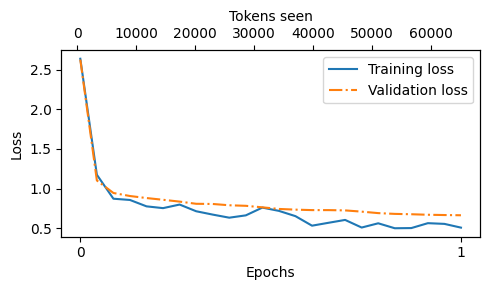

In [ ]:
epochs_tensor = torch.linspace(0, num_epochs, len(train_losses))
plot_losses(epochs_tensor, tokens_seen, train_losses, val_losses)

<div class="alert alert-block alert-info">

Yukarıda gösterilen loss grafiğinden de görebileceğimiz üzere, modelin hem eğitim hem de doğrulama setlerindeki performansı eğitim süreci boyunca önemli ölçüde gelişiyor.

Eğitimin başlangıç aşamasında kayıplardaki hızlı düşüş, modelin veriden anlamlı desenler ve temsiller öğrenmeye başladığını gösteriyor. Eğitim ikinci epoch’a doğru ilerledikçe, kayıplar azalmaya devam ediyor ancak daha yavaş bir hızda; bu da modelin öğrendiği temsilleri ince ayar yaparak kararlı bir çözüme yakınlaştığını gösteriyor.

Şekil’deki loss grafiği modelin etkili bir şekilde eğitildiğini gösterse de, en kritik unsur modelin yanıt kalitesi ve doğruluğu açısından gösterdiği performanstır. Bu bölümün kalan kısımlarında, modelin yanıtlarını çıkartacak ve bu yanıtları kaliteyi değerlendirmeye ve nicel olarak ölçmeye olanak tanıyacak bir formatta depolayacağız.

</div>

## ADIM 6: YANITLARI ÇIKARMA VE KAYDETME

<div class="alert alert-block alert-success">

Önceki bölümde açıklandığı şekilde LLM’i talimat veri kümesinin eğitim kısmı üzerinde fine-tune ettikten sonra, şimdi modelin ayrılmış test seti üzerindeki performansını değerlendirme aşamasına geçiyoruz.

Bunu gerçekleştirmek için, öncelikle test veri kümesindeki her bir girdi için modelin ürettiği yanıtları çıkarıyor ve manuel analiz için topluyoruz.

</div>

<div class="alert alert-block alert-info">

Adım 1: Test setindeki ilk 3 örnek üzerinde yineleme (iterate) yapın.

Adım 2: Daha önce tanımlanan `generate` fonksiyonunu kullanın.

</div>

<div class="alert alert-block alert-warning">

Daha önce de belirtildiği gibi, `generate` fonksiyonu birleşik giriş ve çıkış metnini döndürür. Bu nedenle, modelin yanıtını ayıklamak için `generated_text` içeriği üzerinde slicing (dilimleme) ve `.replace()` metodunu kullanıyoruz.

Aşağıda, verilen talimatlar (instructions), test setindeki beklenen yanıtlar ve modelin ürettiği yanıtlar gösterilmektedir:

</div>

In [ ]:
torch.manual_seed(123)


for entry in test_data[:3]:

    input_text = format_input(entry)

    token_ids = generate(
        model=model,
        idx=text_to_token_ids(input_text, tokenizer).to(device),
        max_new_tokens=256,
        context_size=BASE_CONFIG["context_length"],
        eos_id=50256
    )
    generated_text = token_ids_to_text(token_ids, tokenizer)
    response_text = (
        generated_text[len(input_text):]
        .replace("### Response:", "")
        .strip()
)

    print(input_text)
    print(f"\nCorrect response:\n>> {entry['output']}")
    print(f"\nModel response:\n>> {response_text.strip()}")
    print("-------------------------------------")

Below is an instruction that describes a task. Write a response that appropriately completes the request.

### Instruction:
Rewrite the sentence using a simile.

### Input:
The car is very fast.

Correct response:
>> The car is as fast as lightning.

Model response:
>> The car is as fast as a bullet.
-------------------------------------
Below is an instruction that describes a task. Write a response that appropriately completes the request.

### Instruction:
What type of cloud is typically associated with thunderstorms?

Correct response:
>> The type of cloud typically associated with thunderstorms is cumulonimbus.

Model response:
>> A thunderstorm is a type of cloud that typically forms in the atmosphere over a region of high pressure. It typically produces a strong wind that blows across the area, creating a dense, dense cloud.
-------------------------------------
Below is an instruction that describes a task. Write a response that appropriately completes the request.

### Instruc

<div class="alert alert-block alert-info">

Test setindeki talimatlar, verilen yanıtlar ve modelin ürettiği yanıtlar temel alındığında, modelin göreceli olarak iyi performans gösterdiğini görebiliyoruz.

İlk talimata verilen yanıt açıkça doğruyken, ikinci ve üçüncü yanıtlarda doğruluk bulunmuyor.

Bunun nedeni, donanım sınırlamaları nedeniyle fine-tuning işlemini yalnızca 1 epoch boyunca gerçekleştirmiş olmamızdır. Daha iyi sonuçlar elde edebilmek için epoch sayısını en az 2'ye çıkarmamız gerekmektedir.

</div>

<div class="alert alert-block alert-warning">

En önemlisi, model değerlendirme sürecinin önceki bölümdeki kadar basit olmadığını görebiliyoruz. Önceki bölümde yalnızca doğru spam/non-spam sınıf etiketlerinin yüzdesini hesaplayarak sınıflandırma doğruluğunu elde etmiştik.

Uygulamada, chatbot gibi instruction-finetuned LLM’ler şu yöntemlerle değerlendirilir:

1. **Kısa yanıtlı ve çoktan seçmeli benchmark testleri**, örneğin MMLU (Massive Multitask Language Understanding, [https://arxiv.org/abs/2009.03300](https://arxiv.org/abs/2009.03300)) — modelin genel bilgisini test eder.

2. **İnsan tercihine dayalı karşılaştırmalar**, örneğin LMSYS chatbot arena ([https://arena.lmsys.org](https://arena.lmsys.org)) — farklı LLM’lerin çıktıları karşılaştırılır ve hangisinin tercih edildiği değerlendirilir.

3. **Otomatik diyalog benchmark’ları**, örneğin AlpacaEval ([https://tatsulab.github.io/alpaca\_eval/](https://tatsulab.github.io/alpaca_eval/)) — burada başka bir LLM (örneğin GPT-4) model yanıtlarını değerlendirir ve isteği ne kadar iyi karşıladığını analiz eder.

</div>

<div class="alert alert-block alert-success">

Elimizdeki görevin ölçeği göz önünde bulundurulduğunda, 3. yönteme benzer bir yaklaşım uygulayacağız: yanıtları başka bir LLM kullanarak otomatik olarak değerlendirmek.

Bu sayede, üretilen yanıtların kalitesini verimli bir şekilde değerlendirebiliriz; böylece kapsamlı insan müdahalesine gerek kalmadan, zamandan ve kaynaklardan tasarruf ederken anlamlı performans göstergeleri elde edebiliriz.

</div>

<div class="alert alert-block alert-success">

Bu değerlendirme sürecine hazırlık olarak, model tarafından üretilen yanıtları `test_set` sözlüğüne ekliyoruz ve güncellenmiş veriyi kayıt amaçlı olarak `"instructiondata-with-response.json"` adlı bir dosya olarak kaydediyoruz.

Ayrıca bu dosyayı kaydederek, ileride ihtiyaç duyulması hâlinde yanıtları farklı Python oturumlarında kolayca yükleyip analiz edebiliriz.

</div>

<div class="alert alert-block alert-success">

Aşağıdaki kod, daha önce olduğu gibi `generate` metodunu kullanır; ancak bu sefer tüm `test_set` üzerinde yineleme yaparız.

Ayrıca, model yanıtlarını yazdırmak yerine, bu yanıtları `test_set` sözlüğüne ekleriz:

</div>

In [ ]:
from tqdm import tqdm

for i, entry in tqdm(enumerate(test_data), total=len(test_data)):

    input_text = format_input(entry)

    token_ids = generate(
        model=model,
        idx=text_to_token_ids(input_text, tokenizer).to(device),
        max_new_tokens=256,
        context_size=BASE_CONFIG["context_length"],
        eos_id=50256
    )
    generated_text = token_ids_to_text(token_ids, tokenizer)
    response_text = generated_text[len(input_text):].replace("### Response:", "").strip()

    test_data[i]["model_response"] = response_text


with open("instruction-data-with-response.json", "w") as file:
    json.dump(test_data, file, indent=4)  # "indent" for pretty-printing

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [18:28<00:00, 10.08s/it]


<div class="alert alert-block alert-success">

Yanıtların `test_set` sözlüğüne doğru şekilde eklendiğini doğrulamak için, girdilerden birini inceleyelim:

</div>

In [ ]:
print(test_data[0])

{'instruction': 'Rewrite the sentence using a simile.', 'input': 'The car is very fast.', 'output': 'The car is as fast as lightning.', 'model_response': 'The car is as fast as a bullet.'}


<div class="alert alert-block alert-info">

Çıktıya baktığımızda, `model_response` alanının doğru bir şekilde eklendiğini görebiliyoruz.

</div>

<div class="alert alert-block alert-success">

Son olarak, modeli gelecekteki projelerde yeniden kullanabilmek için `gpt2-medium355M-sft.pth` adlı dosya olarak kaydediyoruz.

</div>

In [ ]:
import re


file_name = f"{re.sub(r'[ ()]', '', CHOOSE_MODEL) }-sft.pth"
torch.save(model.state_dict(), file_name)
print(f"Model saved as {file_name}")

# Load model via
# model.load_state_dict(torch.load("gpt2-medium355M-sft.pth"))

Model saved as gpt2-medium355M-sft.pth


## ADIM 7: FINE-TUNING UYGULANMIŞ LLM’İN DEĞERLENDİRİLMESİ

<div class="alert alert-block alert-success">

Daha önce, instruction fine-tuning uygulanmış bir modelin performansını test setinden 3 örnek üzerindeki yanıtlarına bakarak değerlendirmiştik.

Bu yöntem modelin performansı hakkında kabaca bir fikir verse de, çok sayıda yanıtın değerlendirilmesi söz konusu olduğunda ölçeklenebilir değildir.

Bu nedenle, bu bölümde fine-tuning uygulanmış LLM’in yanıtlarını değerlendirmeyi otomatikleştirmek için başka, daha büyük bir LLM kullanarak bir yöntem uygulayacağız.

</div>

<div class="alert alert-block alert-success">

Test set yanıtlarını otomatik bir şekilde değerlendiren bu adımı uygulamak için, Meta AI tarafından geliştirilen, instruction fine-tuning uygulanmış 8 milyar parametreli bir **Llama 3** modelinden faydalanıyoruz.

Bu model, açık kaynaklı **Ollama** uygulaması ([https://ollama.com](https://ollama.com)) kullanılarak yerel olarak çalıştırılabilir.

</div>

<div class="alert alert-block alert-warning">

**Ollama**, dizüstü bilgisayarda LLM’leri çalıştırmak için verimli bir uygulamadır.

Bu uygulama, LLM’leri en yüksek verimlilikle çalıştırmak üzere saf C/C++ ile geliştirilmiş açık kaynaklı **llama.cpp** kütüphanesinin ([https://github.com/ggerganov/llama.cpp](https://github.com/ggerganov/llama.cpp)) etrafında bir sarmalayıcı (wrapper) olarak hizmet verir.

Ancak şunu unutmamak gerekir: **Ollama yalnızca LLM’lerle metin üretmek (inference) için bir araçtır**; model eğitimi veya fine-tuning işlemlerini desteklemez.

</div>

<div class="alert alert-block alert-success">

Aşağıdaki kod, bir önceki bölümde oluşturulan test seti yanıtlarını değerlendirmek için Ollama’yı kullanmadan önce Ollama oturumunun düzgün şekilde çalıştığını doğrular:

</div>

In [ ]:
import psutil

def check_if_running(process_name):
    running = False
    for proc in psutil.process_iter(["name"]):
        if process_name in proc.info["name"]:
            running = True
            break
    return running

ollama_running = check_if_running("ollama")

if not ollama_running:
    raise RuntimeError("Ollama not running. Launch ollama before proceeding.")
print("Ollama running:", check_if_running("ollama"))

Ollama running: True


<div class="alert alert-block alert-success">

Modele etkileşimli erişim sağlamak için `ollama run` komutuna alternatif bir yöntem de, Python üzerinden REST API kullanmaktır.

Aşağıdaki `query_model` fonksiyonu, bu REST API'yi nasıl kullanacağımızı göstermektedir:

API:</div>

<div class="alert alert-block alert-info">

Adım 1: Veriyi bir sözlük (dictionary) olarak oluştur

Adım 2: Sözlüğü JSON formatında bir string’e çevir ve baytlara (bytes) kodla

Adım 3: POST metodunu ayarlayarak gerekli başlıkları (headers) ekleyen bir istek (request) nesnesi oluştur

Adım 4: İsteği gönder ve yanıtı (response) yakala
    
</div>

In [ ]:
import urllib.request

def query_model(
    prompt,
    model="llama3",
    url="http://localhost:11434/api/chat"
):
    # Veri yükünü (data payload) bir sözlük (dictionary) olarak oluştur.
    data = {
        "model": model,
        "messages": [
            {"role": "user", "content": prompt}
        ],
        "options": {     # Aşağıdaki ayarlar, deterministik (tahmin edilebilir) yanıtlar elde etmek için gereklidir.
            "seed": 123,
            "temperature": 0,
            "num_ctx": 2048
        }
    }


    # Convert the dictionary to a JSON formatted string and encode it to bytes
    payload = json.dumps(data).encode("utf-8")

    # Bir istek (request) nesnesi oluştur, yöntemi (method) **POST** olarak ayarla ve gerekli başlıkları (headers) ekle.
    request = urllib.request.Request(
        url,
        data=payload,
        method="POST"
    )
    request.add_header("Content-Type", "application/json")

    # İsteği gönder ve yanıtı (response) yakala.
    response_data = ""
    with urllib.request.urlopen(request) as response:
        # Yanıtı (response) oku ve çöz (decode)
        while True:
            line = response.readline().decode("utf-8")
            if not line:
                break
            response_json = json.loads(line)
            response_data += response_json["message"]["content"]

    return response_data

<div class="alert alert-block alert-success">

Bu not defterindeki sonraki kod hücrelerini çalıştırmadan önce **Ollama**’nın hâlâ çalıştığından emin olun. Önceki kod hücreleri, modelin aktif olduğunu ve istekleri almaya hazır olduğunu doğrulamak için `"Ollama running: True"` çıktısını vermelidir.

</div>

<div class="alert alert-block alert-success">

Az önce oluşturduğumuz `query_llama` fonksiyonunun nasıl kullanılacağını gösteren bir örnek aşağıda verilmiştir:

</div>

In [ ]:
model = "llama3"
result = query_model("What do Llamas eat?", model)
print(result)

Llamas are herbivores, which means they primarily feed on plant-based foods. Their diet typically consists of:

1. Grasses: Llamas love to graze on various types of grasses, including tall grasses, short grasses, and even weeds.
2. Hay: High-quality hay, such as alfalfa or timothy hay, is a staple in a llama's diet. They enjoy the sweet taste and texture of fresh hay.
3. Grains: Llamas may receive grains like oats, barley, or corn as part of their daily ration. However, it's essential to provide these grains in moderation, as they can be high in calories.
4. Fruits and vegetables: Llamas enjoy a variety of fruits and veggies, such as apples, carrots, sweet potatoes, and leafy greens like kale or spinach.
5. Minerals: Llamas require access to mineral supplements, which help maintain their overall health and well-being.

In the wild, llamas might also eat:

1. Leaves: They'll munch on leaves from trees and shrubs, including plants like willow, alder, and birch.
2. Bark: In some cases, ll

<div class="alert alert-block alert-success">

Daha önce tanımladığımız `query_model` fonksiyonunu kullanarak, fine-tune edilmiş modelimizin ürettiği yanıtları değerlendirebiliriz. Bunu, **Llama 3** modeline, verilen test seti yanıtını referans alarak modelimizin yanıtlarını **0 ile 100 arasında puanlamasını isteyen bir prompt** ile gerçekleştiriyoruz.

</div>

<div class="alert alert-block alert-success">

İlk olarak, bu yaklaşımı önceki bir bölümde incelediğimiz test setindeki **ilk üç örneğe** uyguluyoruz.

</div>

In [ ]:
for entry in test_data[:3]:
    prompt = (
        f"Given the input `{format_input(entry)}` "
        f"and correct output `{entry['output']}`, "
        f"score the model response `{entry['model_response']}`"
        f" on a scale from 0 to 100, where 100 is the best score. "
    )
    print("\nDataset response:")
    print(">>", entry['output'])
    print("\nModel response:")
    print(">>", entry["model_response"])
    print("\nScore:")
    print(">>", query_model(prompt))
    print("\n-------------------------")


Dataset response:
>> The car is as fast as lightning.

Model response:
>> The car is as fast as a bullet.

Score:
>> I'd rate the model response "The car is as fast as a bullet." an 85 out of 100.

Here's why:

* The response uses a simile correctly, comparing the speed of the car to something else (in this case, a bullet).
* The comparison is relevant and makes sense, as bullets are known for their high velocity.
* The phrase "as fast as" is used correctly to introduce the simile.

The only reason I wouldn't give it a perfect score is that some people might find the comparison slightly less vivid or evocative than others. For example, comparing something to lightning (as in the original response) can be more dramatic and attention-grabbing. However, "as fast as a bullet" is still a strong and effective simile that effectively conveys the idea of the car's speed.

Overall, I think the model did a great job!

-------------------------

Dataset response:
>> The type of cloud typically a

<div class="alert alert-block alert-info">

Oluşturulan yanıtlar temel alındığında, **Llama 3** modelinin makul değerlendirmeler yaptığı ve modelin yanıtı tamamen doğru olmadığında **kısmi puanlar verebildiği** gözlemlenebilir.
    
</div>

<div class="alert alert-block alert-info">

Önceki prompt, puanlamanın yanı sıra oldukça ayrıntılı değerlendirmeler döndürüyordu.

Bunu yalnızca **0 ile 100 arasında tam sayı (integer)** puanlar üretecek şekilde değiştirebiliriz; burada **100 en yüksek puanı** temsil eder.

Bu değişiklik, modelimiz için **ortalama bir puan** hesaplamamıza olanak tanır ve böylece modelin performansını daha öz ve nicel bir şekilde değerlendirmemizi sağlar.

</div>

<div class="alert alert-block alert-success">

Aşağıdaki `generate_model_scores` fonksiyonu, modele **"Respond with the integer number only."** şeklinde talimat veren değiştirilmiş bir prompt kullanır:

</div>

In [ ]:
for entry in test_data[:2]:
    prompt = (
            f"Given the input `{format_input(entry)}` "
            f"and correct output `{entry['output']}`, "
            f"score the model response `{entry['model_response']}`"
            f" on a scale from 0 to 100, where 100 is the best score. "
            f"Respond with the integer number only."
        )
    score = query_model(prompt, model)
    print("\nDataset response:")
    print(">>", entry['output'])
    print("\nModel response:")
    print(">>", entry["model_response"])
    print("\nScore:")
    print(">>", query_model(prompt, model))
    print("\n-------------------------")


Dataset response:
>> The car is as fast as lightning.

Model response:
>> The car is as fast as a bullet.

Score:
>> 85

-------------------------

Dataset response:
>> The type of cloud typically associated with thunderstorms is cumulonimbus.

Model response:
>> A thunderstorm is a type of cloud that typically forms in the atmosphere over a region of high pressure. It typically produces a strong wind that blows across the area, creating a dense, dense cloud.

Score:
>> 20

-------------------------


In [ ]:
def generate_model_scores(json_data, json_key, model="llama3"):
    scores = []
    for entry in tqdm(json_data, desc="Scoring entries"):
        prompt = (
            f"Given the input `{format_input(entry)}` "
            f"and correct output `{entry['output']}`, "
            f"score the model response `{entry[json_key]}`"
            f" on a scale from 0 to 100, where 100 is the best score. "
            f"Respond with the integer number only."
        )
        score = query_model(prompt, model)
        try:
            scores.append(int(score))
        except ValueError:
            print(f"Could not convert score: {score}")
            continue

    return scores

<div class="alert alert-block alert-info">

Yukarıdaki kodu çalıştırdığınızda, değerlendirme çıktısı fine-tune edilmiş modelimizin **ortalama 50’nin üzerinde bir puan** aldığını gösterecektir. Bu, modelin performansını diğer modellerle karşılaştırmak ya da farklı eğitim yapılandırmalarını deneyerek performansı artırmak için faydalı bir referans noktası sağlar.

Şunu da belirtmek gerekir ki, bu metnin yazıldığı dönemde **Ollama tamamen deterministik değildir**; bu da elde ettiğiniz puanların yukarıda sunulanlardan **biraz farklılık gösterebileceği** anlamına gelir.

Daha sağlam ve güvenilir sonuçlar elde etmek için, **değerlendirmeyi birkaç kez tekrarlayabilir** ve çıkan puanların **ortalamasını** alabilirsiniz.

</div>

<div class="alert alert-block alert-warning">

Modelimizin performansını daha da artırmak için daha önceki dersimizde gördüğümüz aşağıdaki stratejileri keşfedebiliriz:

1. **Fine-tuning sırasında hiperparametreleri ayarlamak**
   (örneğin öğrenme oranı, batch boyutu veya epoch sayısı gibi).

2. **Eğitim veri kümesinin boyutunu artırmak** veya örnekleri çeşitlendirerek daha geniş konu ve üslup yelpazesini kapsamak.

3. **Modelin yanıtlarını daha etkili yönlendirmek için farklı prompt veya talimat formatlarını denemek.**

4. **Daha büyük bir önceden eğitilmiş model kullanmayı düşünmek**, çünkü bu modeller daha karmaşık desenleri yakalama ve daha doğru yanıtlar üretme kapasitesine sahip olabilir.

5. Ayrıca, **LoRA gibi parametre verimli fine-tuning tekniklerini** kullanabiliriz.

</div>

## SON . . .